<h1>COSIpy with continuum response</h1>

In [1]:
from COSIpy import *
import response
from fit import fit
plt.style.use('thomas')

Welcome to JupyROOT 6.22/02


/usr/local/Cellar/python/3.7.7/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
plt.style.use('thomas')

In [3]:
data_dir = '/Users/thomassiegert/data/COSI/FlightData_Processed_v4/CE0150-5000_33km_GTI/'
filename1 = 'Crab_data_33km_9dets.tra.gz'

In [4]:
# create analysis object
analysis1 = COSIpy(data_dir,filename1)

In [109]:
# read in data (tra file)
analysis1.read_COSI_DataSet()

In [191]:
# define time bins
Delta_T = 7200
analysis1.dataset.time_binning_tags(time_bin_size=Delta_T)

In [192]:
analysis1.dataset.times.total_time

695796.7616381645

In [193]:
analysis1.dataset.times.n_ph

97

In [194]:
analysis1.dataset.times.n_ph_dx

array([  0,   9,  10,  11,  21,  22,  32,  33,  34,  43,  44,  45,  46,
        55,  56,  57,  58,  59,  67,  68,  69,  70,  71,  79,  80,  81,
        82,  83,  91,  92,  93,  94,  95, 103, 104, 105, 106, 107, 116,
       117, 118, 119, 128, 129, 130, 131, 140, 141, 142, 143, 152, 153,
       154, 155, 164, 165, 166, 167, 177, 178, 179, 188, 189, 190, 191,
       200, 201, 202, 211, 212, 213, 214, 223, 224, 225, 235, 236, 237,
       247, 248, 249, 250, 259, 260, 261, 262, 271, 272, 273, 274, 283,
       284, 285, 294, 295, 296, 297])

In [228]:
analysis1.dataset.times.n_ph_t

array([ 860,    0,    0,    0,    0,    0,    0,    0,    0,   17, 9365,
       1259,    0,    0,    0,    0,    0,    0,    0,    0,    0, 4351,
       5349,    0,    0,    0,    0,    0,    0,    0,    0,    0, 4462,
       6912, 4750,    0,    0,    0,    0,    0,    0,    0,    0,  159,
       6569, 6692, 4645,    0,    0,    0,    0,    0,    0,    0,    0,
        976, 6295, 6415, 6599,   12,    0,    0,    0,    0,    0,    0,
          0,  773, 6265, 6447, 6428, 1885,    0,    0,    0,    0,    0,
          0,    0, 1346, 6007, 6298, 6227, 1893,    0,    0,    0,    0,
          0,    0,    0,  922, 6304, 6172, 6304,  583,    0,    0,    0,
          0,    0,    0,    0,  868, 6171, 6171, 6236, 1178,    0,    0,
          0,    0,    0,    0,    0,    0, 4935, 6110, 5958, 2781,    0,
          0,    0,    0,    0,    0,    0,    0, 3089, 6024, 5971, 3460,
          0,    0,    0,    0,    0,    0,    0,    0, 2665, 5952, 5805,
       4678,    0,    0,    0,    0,    0,    0,   

In [195]:
# definition of energy bins (exactly as response right now)
energy_bin_edges=np.array([150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [196]:
energy_bin_edges

array([ 150,  220,  325,  480,  520,  765, 1120, 1650, 2350, 3450, 5000])

In [197]:
# define energy and pixel binning
pixel_size = 6.
analysis1.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)

In [198]:
# bin data
analysis1.dataset.get_binned_data()

In [229]:
np.sum(analysis1.dataset.binned_data,axis=(0,2,3))

array([12933., 45836., 85458., 37699., 84656., 78446., 63482., 31001.,
        7545.,   605.])

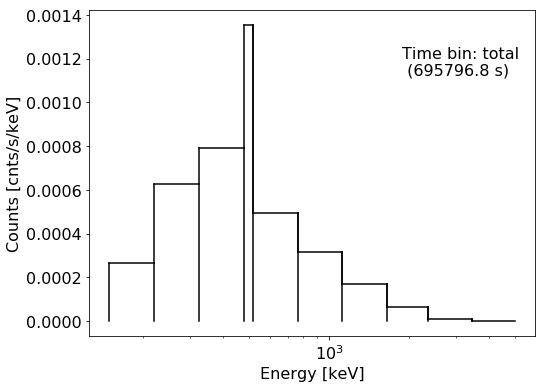

In [200]:
analysis1.dataset.plot_raw_spectrum()
plt.xscale('log')

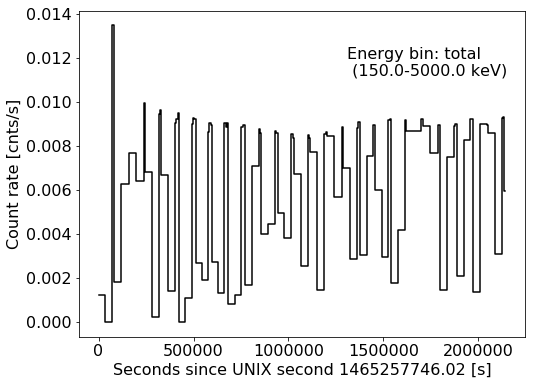

In [201]:
# light curve
analysis1.dataset.plot_lightcurve()

In [202]:
# definition of poitings (balloon stability + Earth rotation)
pointing1 = Pointing(dataset=analysis1.dataset,)

In [203]:
l1,b1 = 184.55746, -5.78436

Text(0, 0.5, 'Latitude [deg]')

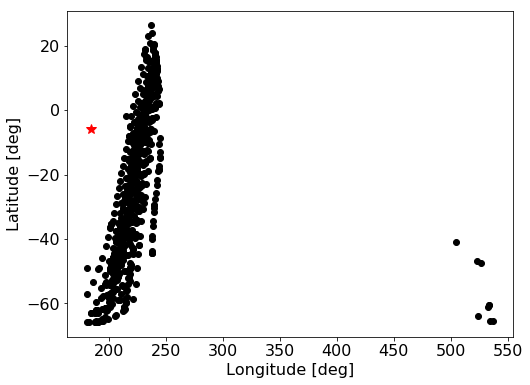

In [204]:
plt.plot(pointing1.zpoins[:,0]+360,pointing1.zpoins[:,1],'o')
plt.plot(l1,b1,'*r',markersize=10)
plt.xlabel('Longitude [deg]')
plt.ylabel('Latitude [deg]')

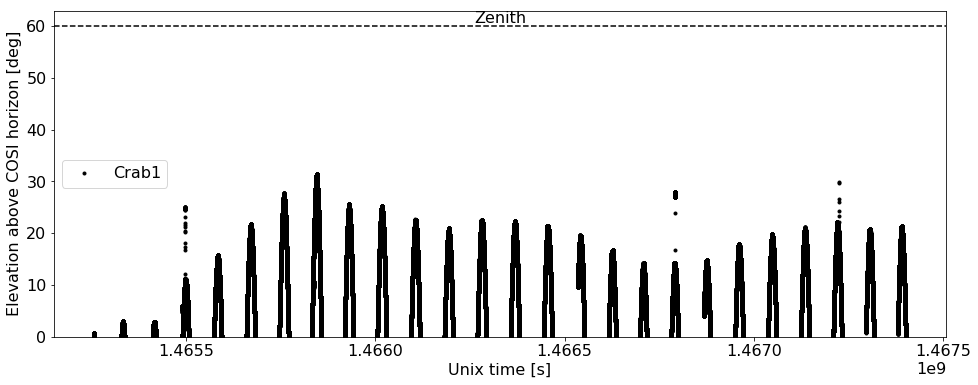

In [205]:
analysis1.plot_elevation([l1],[b1],['Crab1'])

In [206]:
# background
background1 = BG(dataset=analysis1.dataset,mode='sim 6deg despina')

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


<h3>Reading in response (quite large, though)</h3>

In [20]:
rsp = response.SkyResponse(filename='response/RegularResponseGrid_Continuum_10bins_v1.npz',pixel_size=6)

Reading complete continuum response. This might take a while...
Done.

Creating general RMF matrices, stay tuned...



Done.

Creating general IRF. Wait for it...
Done.

Deleting full matrix.
Done. Now have fun.


In [170]:
rsp.rsp.response_grid_normed_efinal.shape

(30, 60, 30, 1145, 10)

In [207]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size,
                          lookup=False)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-5.8)


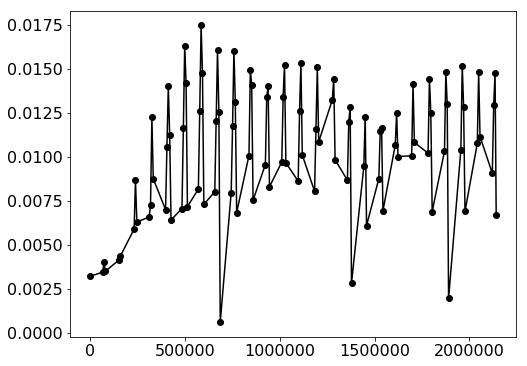

In [210]:
plt.plot(analysis1.dataset.times.times_cen[analysis1.dataset.times.n_ph_dx],
         np.sum(rsp.sky_response[2],axis=1),'o-')

In [211]:
analysis1.dataset.binned_data.shape

(97, 10, 30, 1145)

In [212]:
background1.bg_model.shape

(97, 10, 30, 1145)

In [213]:
rsp.sky_response[0].shape

(97, 803)

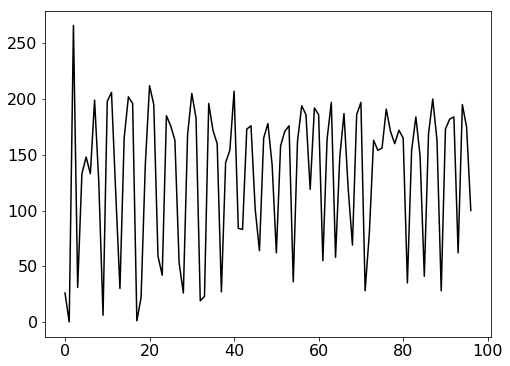

In [215]:
plt.plot(np.sum(analysis1.dataset.binned_data[:,0,:,:],axis=(1,2)))

In [216]:
tracer = np.sum(analysis1.dataset.binned_data,axis=(1,2,3))
tracer = tracer/np.mean(tracer)

In [217]:
# background with tracer (making the zeros zero)
background1 = BG(dataset=analysis1.dataset,mode='sim 6deg despina',tracer=tracer)

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


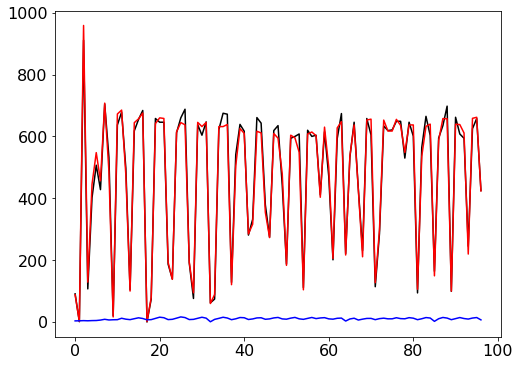

In [218]:
plt.plot(np.sum(analysis1.dataset.binned_data[:,1,:,:],axis=(1,2)))
plt.plot(np.sum(background1.bg_model_reduced[1],axis=1))
plt.plot(np.sum(rsp.sky_response[1],axis=1)*1000)

In [220]:
from fit import *

In [222]:
result1 = fit(analysis1.dataset,
              pointing1,
              rsp,
              background1,
              verbose=True)

In [225]:
result1.MAP_solution(scipy=False)

Start optimising energy bin 1/10...

Energy range: 150-220 keV ...
Start optimising energy bin 2/10...

Energy range: 220-325 keV ...
Start optimising energy bin 3/10...

Energy range: 325-480 keV ...
Start optimising energy bin 4/10...

Energy range: 480-520 keV ...
Start optimising energy bin 5/10...

Energy range: 520-765 keV ...
Start optimising energy bin 6/10...

Energy range: 765-1120 keV ...
Start optimising energy bin 7/10...

Energy range: 1120-1650 keV ...
Start optimising energy bin 8/10...

Energy range: 1650-2350 keV ...
Start optimising energy bin 9/10...

Energy range: 2350-3450 keV ...
Start optimising energy bin 10/10...

Energy range: 3450-5000 keV ...
Initial log joint probability = -18318
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      11      -18293.9    0.00718653      0.156479           1           1       15   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolera

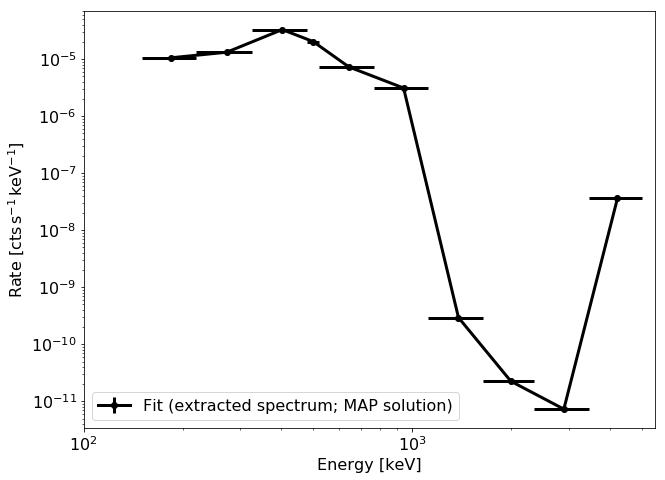

In [226]:
result1.plot_MAP_spectrum()

In [227]:
result1.fit(iters=2000,use_emcee=True)

  1%|          | 11/2000 [00:00<00:19, 103.72it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  0%|          | 6/2000 [00:00<00:37, 53.61it/s]

Processing took 14.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.21e+02  1.19e+02  1.89e+02  4.01e+02  5.22e+02  6.45e+02  8.70e+02
        1:  9.57e-01  1.08e-02  9.26e-01  9.46e-01  9.57e-01  9.68e-01  9.88e-01
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  0%|          | 4/2000 [00:00<00:57, 34.68it/s]

Processing took 30.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.45e+02  2.45e+02  2.30e+02  7.02e+02  9.36e+02  1.20e+03  1.64e+03
        1:  9.77e-01  6.00e-03  9.59e-01  9.71e-01  9.77e-01  9.83e-01  9.96e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  0%|          | 4/2000 [00:00<00:58, 33.93it/s]

Processing took 47.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.55e+03  3.47e+02  2.44e+03  3.20e+03  3.54e+03  3.90e+03  4.50e+03
        1:  9.58e-01  4.71e-03  9.43e-01  9.53e-01  9.58e-01  9.63e-01  9.72e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  0%|          | 3/2000 [00:00<01:18, 25.42it/s]

Processing took 50.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.83e+02  1.68e+02  1.40e+02  4.12e+02  5.76e+02  7.56e+02  1.10e+03
        1:  9.84e-01  5.61e-03  9.67e-01  9.78e-01  9.84e-01  9.89e-01  1.00e+00
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  0%|          | 3/2000 [00:00<01:18, 25.43it/s]

Processing took 68.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.26e+03  2.33e+02  5.51e+02  1.03e+03  1.25e+03  1.50e+03  1.96e+03
        1:  9.85e-01  3.80e-03  9.73e-01  9.81e-01  9.85e-01  9.89e-01  9.95e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


  0%|          | 2/2000 [00:00<01:44, 19.17it/s]

Processing took 69.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  7.63e+02  2.09e+02  1.57e+02  5.54e+02  7.54e+02  9.77e+02  1.48e+03
        1:  9.90e-01  3.56e-03  9.80e-01  9.87e-01  9.90e-01  9.94e-01  1.00e+00
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


  0%|          | 3/2000 [00:00<01:33, 21.46it/s]

Processing took 97.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  8.62e+01  7.56e+01  3.94e-02  1.81e+01  6.55e+01  1.59e+02  3.91e+02
        1:  9.99e-01  2.97e-03  9.90e-01  9.95e-01  9.99e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  0%|          | 2/2000 [00:00<01:52, 17.68it/s]

Processing took 96.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.20e+01  2.95e+01  3.53e-02  5.62e+00  2.38e+01  5.95e+01  1.70e+02
        1:  9.99e-01  4.19e-03  9.87e-01  9.94e-01  9.99e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  0%|          | 3/2000 [00:00<01:09, 28.63it/s]

Processing took 94.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.02e+01  1.81e+01  5.99e-02  3.87e+00  1.50e+01  3.78e+01  9.65e+01
        1:  9.97e-01  8.23e-03  9.69e-01  9.88e-01  9.97e-01  1.00e+00  1.02e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 2000/2000 [01:08<00:00, 29.06it/s]


Processing took 68.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  4.03e+01  1.26e+01  4.84e+00  2.76e+01  4.02e+01  5.28e+01  7.91e+01
        1:  8.96e-01  3.47e-02  7.94e-01  8.61e-01  8.97e-01  9.31e-01  1.01e+00
###################################################################


(150, 3450)

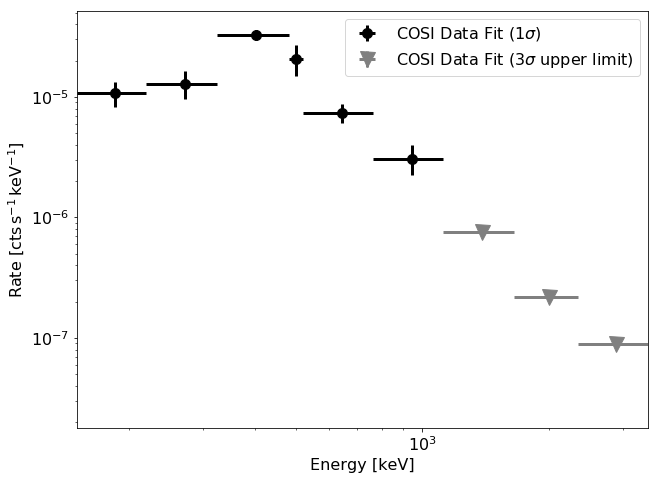

In [266]:
pc = result1.plot_extracted_spectrum(ul=3,)
plt.xlim(150,3450)

In [82]:
"""result1.fit(iters=2000)"""

'result1.fit(iters=2000)'

In [232]:
prior_crab = {0: ('truncated_normal_prior',1e-9,1e8,0,np.inf,r'$C_0$'),
              1: ('normal_prior',-2.0,5.0,r'$\alpha$')}
function = 'powerlaw'

In [244]:
result1.fit_spectrum(function,prior_crab,iters=10000,e_select=np.arange(0,9),with_systematics=False)

  2%|▏         | 156/10000 [00:00<00:12, 777.94it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 10000/10000 [00:09<00:00, 1042.63it/s]


Processing took 9.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  4.55e-09  5.92e-10  2.82e-09  3.96e-09  4.55e-09  5.15e-09  6.32e-09
 $\alpha$: -3.00e+00  1.21e-01 -3.42e+00 -3.12e+00 -2.99e+00 -2.88e+00 -2.65e+00


Chi2 (dof): 38.8 (7)


In [245]:
result1.calculate_model_posteriors()

78000 80000


array([<matplotlib.axes._subplots.AxesSubplot object at 0x147ae2550>,
      dtype=object)

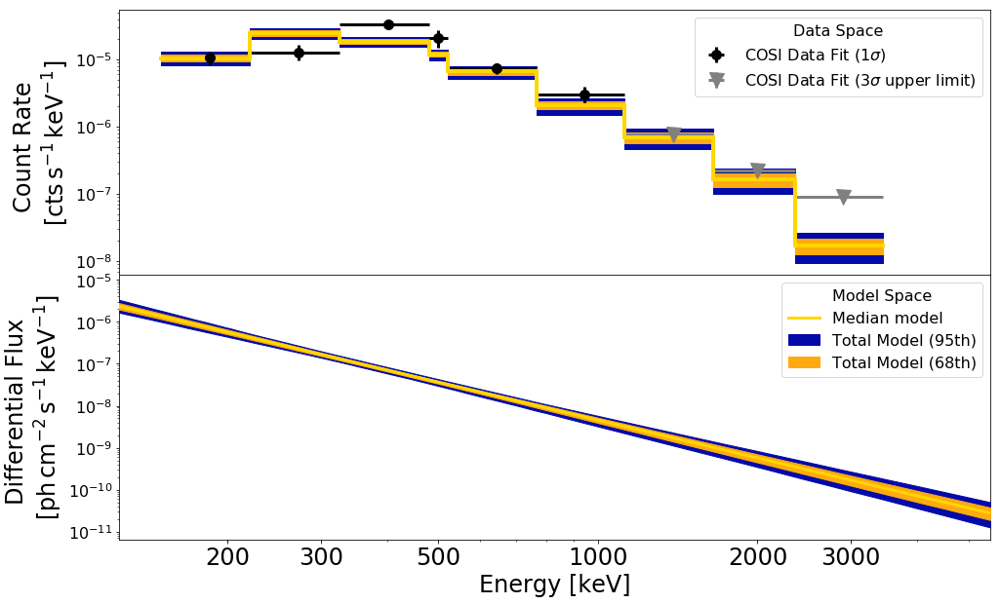

In [249]:
result1.plot_posterior_spectrum(ul=3,with_systematics=False)

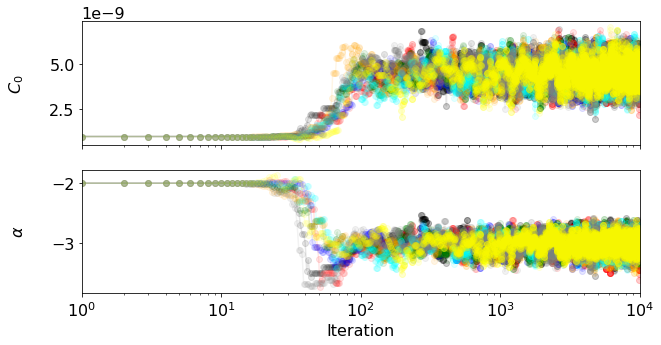

In [250]:
result1.plot_parameter_chains()

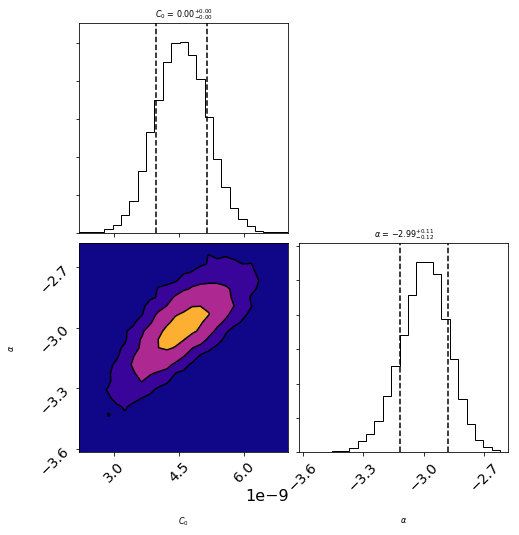

In [251]:
result1.corner_plot()

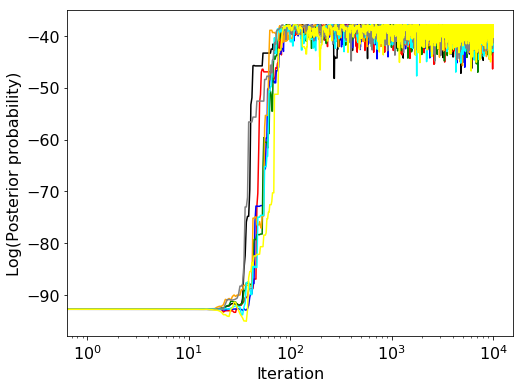

In [252]:
result1.plot_posterior_chains()

In [253]:
bs = 60
num = 14

l_gridg = np.linspace(l1-bs,l1+bs,num)
b_gridg = np.linspace(b1-bs,b1+bs,num)

l_grid = l_gridg[0:-1]+np.diff(l_gridg[0:-1])[0]/2
b_grid = b_gridg[0:-1]+np.diff(b_gridg[0:-1])[0]/2

l_grid[l_grid<-180] += 360

L_GRIDg, B_GRIDg = np.meshgrid(l_gridg,b_gridg)
L_GRID, B_GRID = np.meshgrid(l_grid,b_grid)

In [256]:
analysis1.dataset.n_time_bins,analysis1.dataset.times.n_ph

(298, 97)

In [257]:
"""background1.make_bg_cuts([1,2,3,4,5,6,7,8,9,10])"""

'background1.make_bg_cuts([1,2,3,4,5,6,7,8,9,10])'

In [258]:
rsp.calculate_PS_response(analysis1.dataset,
                          pointing1,l1,b1,1,
                          background=background1,
                          pixel_size=pixel_size,
                          lookup=False)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-5.8)


In [259]:
result2 = fit(analysis1.dataset,
              pointing1,
              rsp,
              background1)

In [260]:
result2.TS_map([L_GRID,B_GRID],scipy=False,ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],lookup=False)

1
Fitting background only...


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...


Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-61.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-51.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-42.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-33.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-24.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-15.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,-5.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,3.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,12.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,21.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,31.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,40.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (129.2,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (138.4,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (147.6,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (156.9,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (166.1,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (175.3,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (193.8,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (203.0,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (212.2,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (221.5,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (230.7,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (239.9,49.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Initial log joint probability = -120161
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       2       -120156   0.000487245      0.215637           1           1        4   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -120681
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      17       -120155     0.0535362       2.09731      0.8681      0.8681       20   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below 

array([<matplotlib.axes._subplots.AxesSubplot object at 0x14a251510>,
      dtype=object)

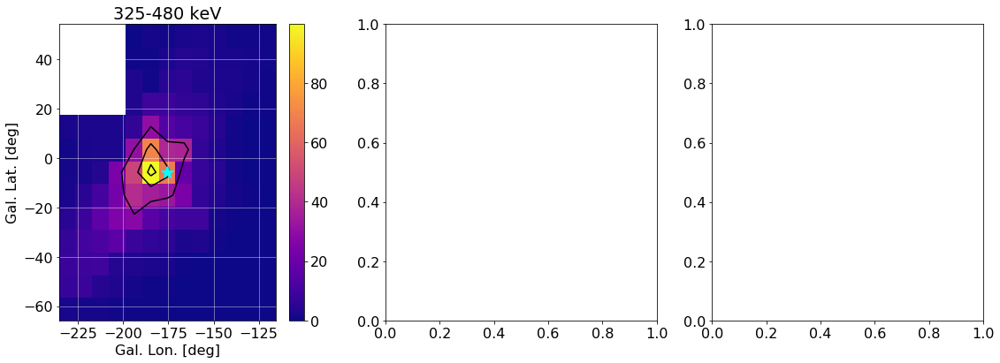

In [265]:
result2.plot_TS_map_results(ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],l_src=l1-360,b_src=b1)

In [268]:
from COSIpy import *

In [269]:
analysis2 = COSIpy(data_dir,filename1)

In [270]:
analysis2.read_COSI_DataSet()

In [271]:
# define energy and pixel binning
Delta_T2 = 1800
analysis2.dataset.time_binning_tags(time_bin_size=Delta_T2)
pixel_size = 6.
analysis2.dataset.init_binning(energy_bin_edges=energy_bin_edges,pixel_size=pixel_size)

In [272]:
analysis2.dataset.get_binned_data()

In [273]:
analysis2.dataset.times.n_ph

308

In [274]:
pointing2 = Pointing(dataset=analysis2.dataset,)

In [300]:
tracer2 = np.sum(analysis2.dataset.binned_data,axis=(1,2,3))
tracer2 = tracer2/np.mean(tracer2)
# background
background2 = BG(dataset=analysis2.dataset,mode='sim 6deg despina',tracer=tracer2)

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


In [301]:
rsp.calculate_PS_response(analysis2.dataset,
                          pointing2,l1,b1,1,
                          background=background2,
                          pixel_size=pixel_size,
                          lookup=False)

In [302]:
result3 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2,
              verbose=True)

In [303]:
result3.MAP_solution()

Start optimising energy bin 1/10...

Energy range: 150-220 keV ...
Start optimising energy bin 2/10...

Energy range: 220-325 keV ...
Start optimising energy bin 3/10...

Energy range: 325-480 keV ...
Start optimising energy bin 4/10...

Energy range: 480-520 keV ...
Start optimising energy bin 5/10...

Energy range: 520-765 keV ...
Start optimising energy bin 6/10...

Energy range: 765-1120 keV ...
Start optimising energy bin 7/10...

Energy range: 1120-1650 keV ...
Start optimising energy bin 8/10...

Energy range: 1650-2350 keV ...
Start optimising energy bin 9/10...

Energy range: 2350-3450 keV ...
Start optimising energy bin 10/10...

Energy range: 3450-5000 keV ...
Initial log joint probability = -34624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      12      -34597.6    0.00709355       0.60034       0.843       0.843       14   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolera

In [304]:
from COSIpy_tools import step_plot

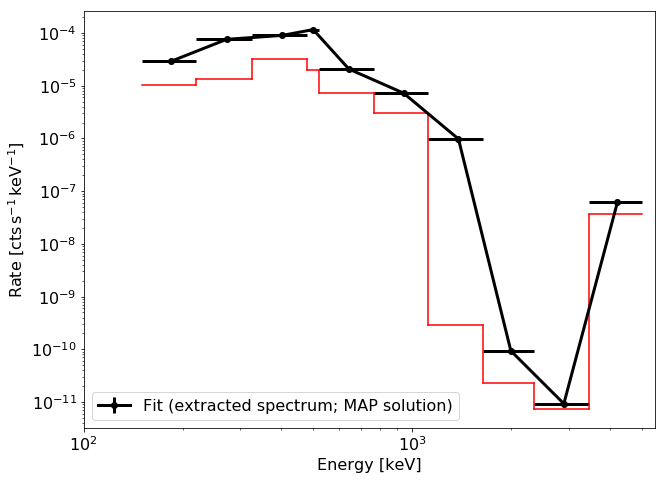

In [305]:
result3.plot_MAP_spectrum()
step_plot(analysis1.dataset.energies.energy_bin_edges,result1.diff_rate_map,color='red')

In [306]:
result3.fit(use_emcee=True)

  0%|          | 4/1000 [00:00<00:30, 33.17it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 29.1 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.13e+03  1.59e+02  6.61e+02  9.69e+02  1.13e+03  1.28e+03  1.57e+03
        1:  9.10e-01  1.37e-02  8.69e-01  8.97e-01  9.11e-01  9.24e-01  9.49e-01
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 73.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  4.42e+03  3.52e+02  3.32e+03  4.07e+03  4.42e+03  4.76e+03  5.51e+03
        1:  9.02e-01  8.45e-03  8.78e-01  8.93e-01  9.01e-01  9.10e-01  9.25e-01
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 111.3 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  7.78e+03  4.23e+02  6.54e+03  7.36e+03  7.78e+03  8.20e+03  9.10e+03
        1:  9.09e-01  5.51e-03  8.93e-01  9.03e-01  9.09e-01  9.14e-01  9.26e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 116.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.59e+03  2.66e+02  1.83e+03  2.33e+03  2.59e+03  2.84e+03  3.40e+03
        1:  9.30e-01  7.71e-03  9.10e-01  9.23e-01  9.30e-01  9.39e-01  9.55e-01
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 124.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.79e+03  3.11e+02  1.97e+03  2.49e+03  2.78e+03  3.10e+03  3.69e+03
        1:  9.67e-01  4.50e-03  9.53e-01  9.62e-01  9.67e-01  9.71e-01  9.78e-01
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


100%|██████████| 1000/1000 [02:17<00:00,  7.27it/s]


Processing took 137.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.44e+03  2.70e+02  6.88e+02  1.17e+03  1.44e+03  1.71e+03  2.29e+03
        1:  9.82e-01  4.32e-03  9.69e-01  9.77e-01  9.82e-01  9.86e-01  9.93e-01
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


100%|██████████| 1000/1000 [02:47<00:00,  5.99it/s]


Processing took 167.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.37e+02  1.83e+02  1.47e+00  1.42e+02  3.23e+02  5.23e+02  9.27e+02
        1:  9.95e-01  4.12e-03  9.81e-01  9.91e-01  9.95e-01  9.99e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 160.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  4.77e+01  4.10e+01  2.75e-01  1.09e+01  3.58e+01  8.81e+01  2.31e+02
        1:  9.98e-01  4.04e-03  9.86e-01  9.94e-01  9.99e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 167.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.79e+01  1.68e+01  4.44e-02  3.88e+00  1.31e+01  3.17e+01  1.13e+02
        1:  9.98e-01  7.98e-03  9.75e-01  9.89e-01  9.98e-01  1.01e+00  1.02e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 1000/1000 [02:15<00:00,  7.31it/s]


Processing took 135.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  5.51e+01  1.38e+01  1.41e+01  4.10e+01  5.52e+01  6.89e+01  9.90e+01
        1:  8.73e-01  3.16e-02  7.83e-01  8.42e-01  8.71e-01  9.03e-01  9.70e-01
###################################################################


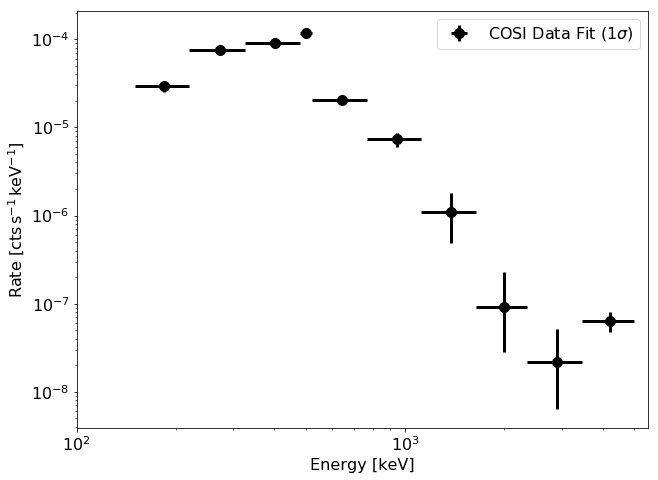

In [307]:
result3.plot_extracted_spectrum()

In [308]:
result3.fit_spectrum(function=function,prior=prior_crab,iters=10000)

  1%|          | 89/10000 [00:00<00:11, 882.77it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 10000/10000 [00:10<00:00, 981.52it/s]


Processing took 10.2 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  1.46e-08  1.03e-09  1.17e-08  1.35e-08  1.46e-08  1.56e-08  1.77e-08
 $\alpha$: -3.06e+00  6.36e-02 -3.25e+00 -3.13e+00 -3.06e+00 -3.00e+00 -2.88e+00


Chi2 (dof): 105.8 (8)


In [309]:
result3.calculate_model_posteriors()

78000 80000


array([<matplotlib.axes._subplots.AxesSubplot object at 0x14e4f6710>,
      dtype=object)

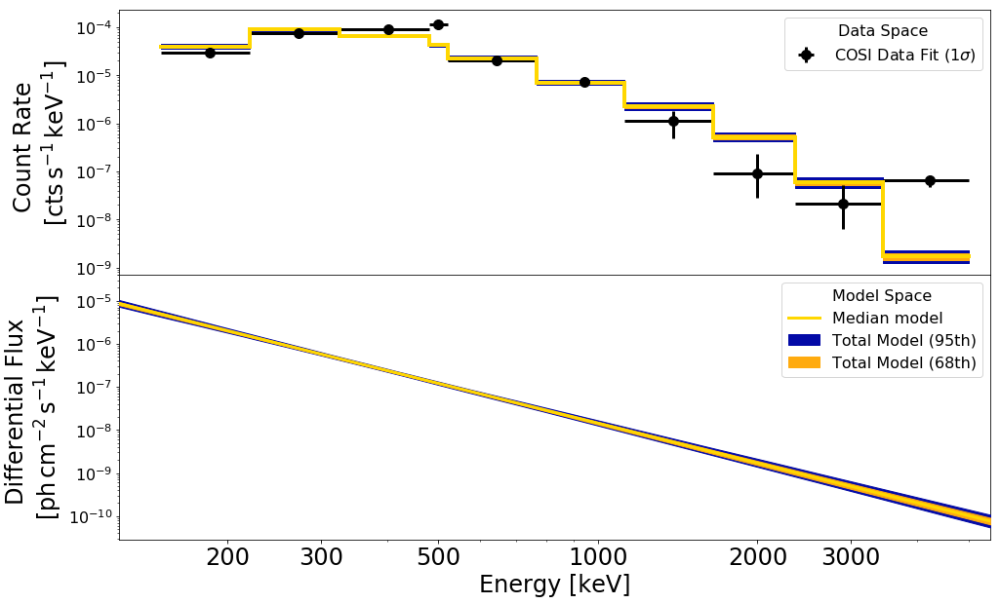

In [310]:
result3.plot_posterior_spectrum()

In [311]:
result4 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2)

In [312]:
result4.TS_map([L_GRID,B_GRID],scipy=False,ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],lookup=False)

1
Fitting background only...


Initial log joint probability = -227903
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       2       -227898   0.000487245      0.215637           1           1        4   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -228247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      17       -227894     0.0600419      0.958916           1           1       21   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -228217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      15       -227895     0.0248488      0.605636           1           1       17   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probabi

array([<matplotlib.axes._subplots.AxesSubplot object at 0x14ea4aa10>,
      dtype=object)

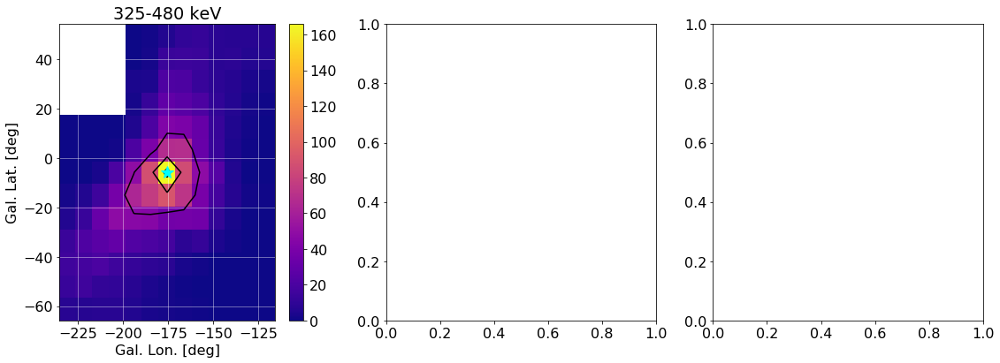

In [316]:
result4.plot_TS_map_results(ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],l_src=l1-360,b_src=b1)

In [317]:
bs = 70
num = 24

l_gridg = np.linspace(l1-bs,l1+bs,num)
b_gridg = np.linspace(b1-bs,b1+bs,num)

l_grid = l_gridg[0:-1]+np.diff(l_gridg[0:-1])[0]/2
b_grid = b_gridg[0:-1]+np.diff(b_gridg[0:-1])[0]/2

l_grid[l_grid<-180] += 360

L_GRIDg, B_GRIDg = np.meshgrid(l_gridg,b_gridg)
L_GRID, B_GRID = np.meshgrid(l_grid,b_grid)

In [318]:
result5 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2)

In [321]:
result5.TS_map([L_GRID,B_GRID],scipy=False,lookup=False)

10
Fitting background only...


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [334]:
fov[0].shape

(100,)

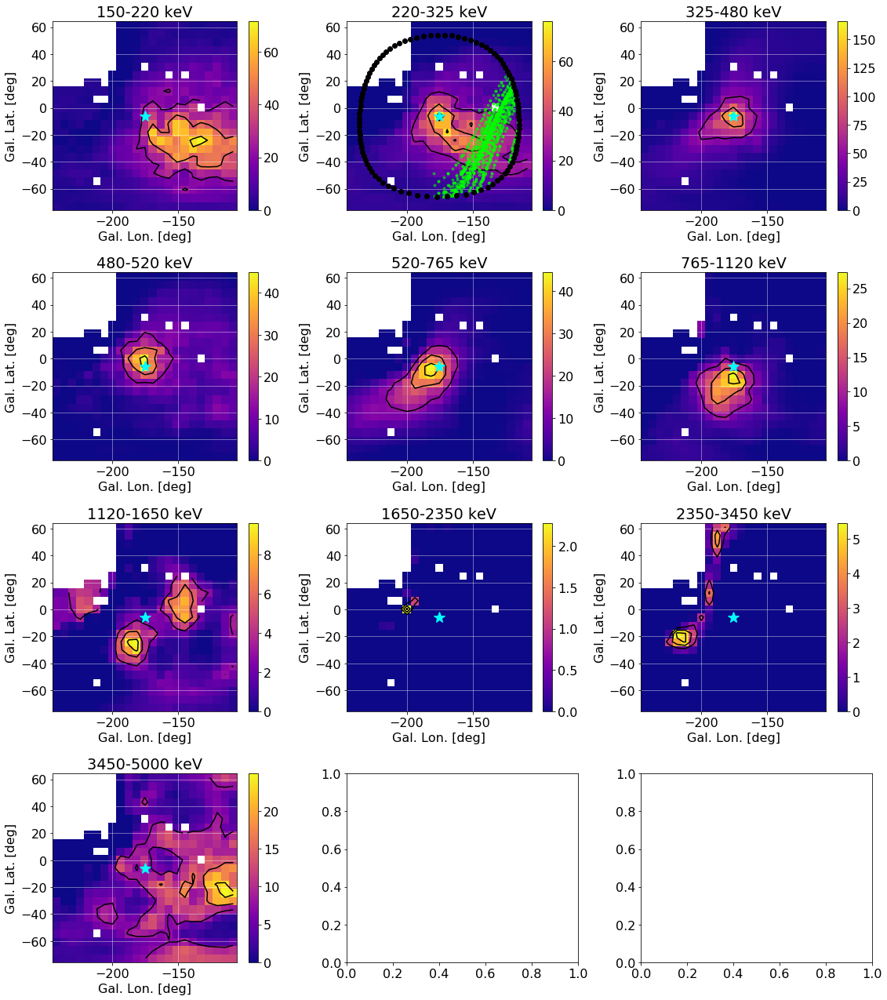

In [343]:
pc = result5.plot_TS_map_results(l_src=l1-360,b_src=b1)
pc[0,1].plot(pointing2.zpoins[:,0],pointing2.zpoins[:,1],'.',color='lime',alpha=0.5)
pc[0,1].set_xlim(l_gridg[0]-360,l_gridg[-1]-360)
fov = circle_on_the_sky(l1-360,b1,60)
pc[0,1].plot(fov[0][fov[0] > -180],fov[1][fov[0] > -180],'ko')
pc[0,1].plot(fov[0][fov[0] > -180]-360,fov[1][fov[0] > -180],'ko')

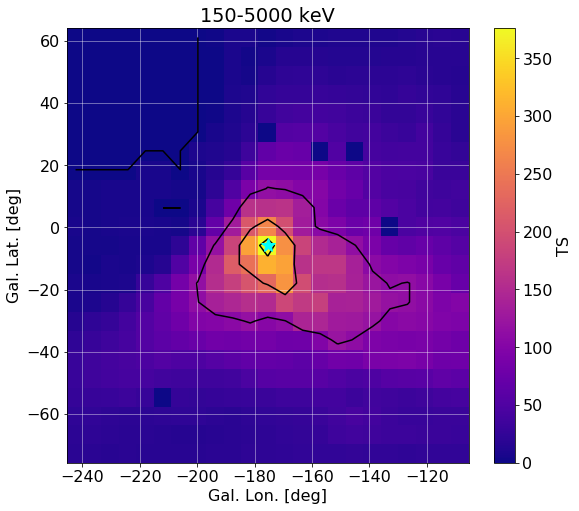

In [324]:
result5.plot_TS_map_results(mode='sum',l_src=l1-360,b_src=b1)

In [344]:
background3 = BG(dataset=analysis2.dataset,mode='default 6deg',tracer=tracer2)

Reading in flight-average background response for 6 deg CDS binning ...


In [345]:
rsp.calculate_PS_response(analysis2.dataset,
                          pointing2,l1,b1,1,
                          background=background3,
                          pixel_size=pixel_size,
                          lookup=False)

In [346]:
result6 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background3,
              verbose=True)

In [347]:
result6.fit(use_emcee=True)

  0%|          | 3/1000 [00:00<00:45, 21.80it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 41.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.13e+02  1.07e+02  2.46e+01  2.09e+02  3.13e+02  4.23e+02  6.42e+02
        1:  9.76e-01  1.03e-02  9.42e-01  9.66e-01  9.76e-01  9.86e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 102.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.31e+02  1.84e+02  5.71e-01  5.16e+01  1.84e+02  4.17e+02  1.03e+03
        1:  9.95e-01  4.94e-03  9.79e-01  9.90e-01  9.96e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 3/10...

Energy range: 325-480 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 128.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.74e+03  3.92e+02  5.76e+02  1.35e+03  1.75e+03  2.13e+03  2.82e+03
        1:  9.79e-01  4.91e-03  9.66e-01  9.74e-01  9.79e-01  9.84e-01  9.95e-01
###################################################################
###################################################################

Start fitting energy bin 4/10...

Energy range: 480-520 keV ...


100%|██████████| 1000/1000 [02:08<00:00,  7.67it/s]


Processing took 128.5 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.30e+02  1.96e+02  5.63e-01  1.20e+02  3.09e+02  5.32e+02  9.48e+02
        1:  9.91e-01  6.42e-03  9.70e-01  9.84e-01  9.91e-01  9.97e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 5/10...

Energy range: 520-765 keV ...


100%|██████████| 1000/1000 [02:30<00:00,  6.17it/s]


Processing took 150.9 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.09e+03  2.84e+02  2.31e+02  8.10e+02  1.08e+03  1.37e+03  1.97e+03
        1:  9.87e-01  4.30e-03  9.75e-01  9.83e-01  9.87e-01  9.91e-01  1.00e+00
###################################################################
###################################################################

Start fitting energy bin 6/10...

Energy range: 765-1120 keV ...


100%|██████████| 1000/1000 [02:54<00:00,  5.92it/s]


Processing took 174.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  9.52e+02  2.54e+02  2.48e+02  6.94e+02  9.36e+02  1.21e+03  1.78e+03
        1:  9.88e-01  4.10e-03  9.76e-01  9.84e-01  9.88e-01  9.92e-01  1.00e+00
###################################################################
###################################################################

Start fitting energy bin 7/10...

Energy range: 1120-1650 keV ...


100%|██████████| 1000/1000 [02:59<00:00,  5.33it/s]


Processing took 180.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  3.20e+02  1.68e+02  2.77e+00  1.36e+02  3.13e+02  4.95e+02  8.35e+02
        1:  9.95e-01  4.02e-03  9.82e-01  9.91e-01  9.95e-01  9.99e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 8/10...

Energy range: 1650-2350 keV ...


100%|██████████| 1000/1000 [03:08<00:00,  5.32it/s]


Processing took 188.6 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.09e+02  8.20e+01  4.07e-01  2.68e+01  9.29e+01  1.94e+02  4.28e+02
        1:  9.96e-01  4.54e-03  9.82e-01  9.92e-01  9.96e-01  1.00e+00  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 9/10...

Energy range: 2350-3450 keV ...


100%|██████████| 1000/1000 [03:07<00:00,  5.39it/s]


Processing took 187.4 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.55e+02  4.12e+01  3.65e+01  1.13e+02  1.56e+02  1.97e+02  2.81e+02
        1:  9.80e-01  9.72e-03  9.52e-01  9.71e-01  9.80e-01  9.90e-01  1.01e+00
###################################################################
###################################################################

Start fitting energy bin 10/10...

Energy range: 3450-5000 keV ...


100%|██████████| 1000/1000 [02:51<00:00,  5.84it/s]


Processing took 172.0 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  1.76e+01  8.96e+00  1.65e-02  8.33e+00  1.69e+01  2.65e+01  5.40e+01
        1:  9.70e-01  2.91e-02  8.87e-01  9.42e-01  9.69e-01  1.00e+00  1.06e+00
###################################################################


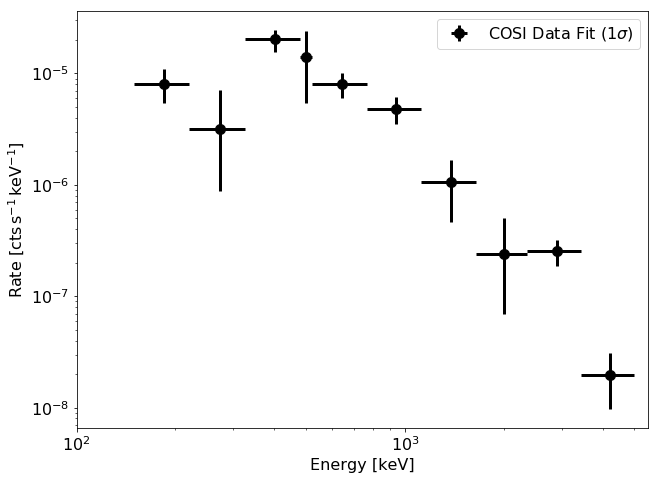

In [348]:
result6.plot_extracted_spectrum()

In [349]:
result6.fit_spectrum(function,prior=prior_crab)

  4%|▎         | 72/2000 [00:00<00:02, 714.11it/s]

Fitting spectrum ... with some info included here ...


100%|██████████| 2000/2000 [00:02<00:00, 750.28it/s]


Processing took 2.7 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
    $C_0$:  7.10e-09  9.96e-10  4.00e-09  6.13e-09  7.08e-09  8.10e-09  1.00e-08
 $\alpha$: -1.86e+00  2.11e-01 -2.45e+00 -2.08e+00 -1.86e+00 -1.66e+00 -1.22e+00


Chi2 (dof): 20.4 (8)


In [350]:
result6.TS_map([L_GRID,B_GRID],scipy=False,ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],lookup=False)

1
Fitting background only...


Now fitting object at (l,b) = (-242.4,-72.7)


Now fitting object at (l,b) = (-236.3,-72.7)


Now fitting object at (l,b) = (-230.2,-72.7)


Now fitting object at (l,b) = (-224.1,-72.7)


Now fitting object at (l,b) = (-218.1,-72.7)


Now fitting object at (l,b) = (-212.0,-72.7)


Now fitting object at (l,b) = (-205.9,-72.7)


Now fitting object at (l,b) = (-199.8,-72.7)


Now fitting object at (l,b) = (-193.7,-72.7)


Now fitting object at (l,b) = (-187.6,-72.7)


Now fitting object at (l,b) = (-181.5,-72.7)


Now fitting object at (l,b) = (-175.4,-72.7)


Now fitting object at (l,b) = (-169.4,-72.7)


Now fitting object at (l,b) = (-163.3,-72.7)


Now fitting object at (l,b) = (-157.2,-72.7)


Now fitting object at (l,b) = (-151.1,-72.7)


Now fitting object at (l,b) = (-145.0,-72.7)


Now fitting object at (l,b) = (-138.9,-72.7)


Now fitting object at (l,b) = (-132.8,-72.7)


Now fitting object at (l,b) = (-126.7,-72.7)


Now fitting object at (l,b) = (-120.7,-72.7)


Now fitting object at (l,b) = (-114.6,-72.7)


Now fitting object at (l,b) = (-108.5,-72.7)


Now fitting object at (l,b) = (117.6,-66.7)


Now fitting object at (l,b) = (123.7,-66.7)


Now fitting object at (l,b) = (129.8,-66.7)


Now fitting object at (l,b) = (135.9,-66.7)


Now fitting object at (l,b) = (141.9,-66.7)


Now fitting object at (l,b) = (148.0,-66.7)


Now fitting object at (l,b) = (154.1,-66.7)


Now fitting object at (l,b) = (160.2,-66.7)


Now fitting object at (l,b) = (166.3,-66.7)


Now fitting object at (l,b) = (172.4,-66.7)


Now fitting object at (l,b) = (178.5,-66.7)


Now fitting object at (l,b) = (184.6,-66.7)


Now fitting object at (l,b) = (190.6,-66.7)


Now fitting object at (l,b) = (196.7,-66.7)


Now fitting object at (l,b) = (202.8,-66.7)


Now fitting object at (l,b) = (208.9,-66.7)


Now fitting object at (l,b) = (215.0,-66.7)


Now fitting object at (l,b) = (221.1,-66.7)


Now fitting object at (l,b) = (227.2,-66.7)


Now fitting object at (l,b) = (233.3,-66.7)


Now fitting object at (l,b) = (239.3,-66.7)


Now fitting object at (l,b) = (245.4,-66.7)


Now fitting object at (l,b) = (251.5,-66.7)


Now fitting object at (l,b) = (117.6,-60.6)


Now fitting object at (l,b) = (123.7,-60.6)


Now fitting object at (l,b) = (129.8,-60.6)


Now fitting object at (l,b) = (135.9,-60.6)


Now fitting object at (l,b) = (141.9,-60.6)


Now fitting object at (l,b) = (148.0,-60.6)


Now fitting object at (l,b) = (154.1,-60.6)


Now fitting object at (l,b) = (160.2,-60.6)


Now fitting object at (l,b) = (166.3,-60.6)


Now fitting object at (l,b) = (172.4,-60.6)


Now fitting object at (l,b) = (178.5,-60.6)


Now fitting object at (l,b) = (184.6,-60.6)


Now fitting object at (l,b) = (190.6,-60.6)


Now fitting object at (l,b) = (196.7,-60.6)


Now fitting object at (l,b) = (202.8,-60.6)


Now fitting object at (l,b) = (208.9,-60.6)


Now fitting object at (l,b) = (215.0,-60.6)


Now fitting object at (l,b) = (221.1,-60.6)


Now fitting object at (l,b) = (227.2,-60.6)


Now fitting object at (l,b) = (233.3,-60.6)


Now fitting object at (l,b) = (239.3,-60.6)


Now fitting object at (l,b) = (245.4,-60.6)


Now fitting object at (l,b) = (251.5,-60.6)


Now fitting object at (l,b) = (117.6,-54.5)


Now fitting object at (l,b) = (123.7,-54.5)


Now fitting object at (l,b) = (129.8,-54.5)


Now fitting object at (l,b) = (135.9,-54.5)


Now fitting object at (l,b) = (141.9,-54.5)


Now fitting object at (l,b) = (148.0,-54.5)


Now fitting object at (l,b) = (154.1,-54.5)


Now fitting object at (l,b) = (160.2,-54.5)


Now fitting object at (l,b) = (166.3,-54.5)


Now fitting object at (l,b) = (172.4,-54.5)


Now fitting object at (l,b) = (178.5,-54.5)


Now fitting object at (l,b) = (184.6,-54.5)


Now fitting object at (l,b) = (190.6,-54.5)


Now fitting object at (l,b) = (196.7,-54.5)


Now fitting object at (l,b) = (202.8,-54.5)


Now fitting object at (l,b) = (208.9,-54.5)


Now fitting object at (l,b) = (215.0,-54.5)


Now fitting object at (l,b) = (221.1,-54.5)


Now fitting object at (l,b) = (227.2,-54.5)


Now fitting object at (l,b) = (233.3,-54.5)


Now fitting object at (l,b) = (239.3,-54.5)


Now fitting object at (l,b) = (245.4,-54.5)


Now fitting object at (l,b) = (251.5,-54.5)


Now fitting object at (l,b) = (117.6,-48.4)


Now fitting object at (l,b) = (123.7,-48.4)


Now fitting object at (l,b) = (129.8,-48.4)


Now fitting object at (l,b) = (135.9,-48.4)


Now fitting object at (l,b) = (141.9,-48.4)


Now fitting object at (l,b) = (148.0,-48.4)


Now fitting object at (l,b) = (154.1,-48.4)


Now fitting object at (l,b) = (160.2,-48.4)


Now fitting object at (l,b) = (166.3,-48.4)


Now fitting object at (l,b) = (172.4,-48.4)


Now fitting object at (l,b) = (178.5,-48.4)


Now fitting object at (l,b) = (184.6,-48.4)


Now fitting object at (l,b) = (190.6,-48.4)


Now fitting object at (l,b) = (196.7,-48.4)


Now fitting object at (l,b) = (202.8,-48.4)


Now fitting object at (l,b) = (208.9,-48.4)


Now fitting object at (l,b) = (215.0,-48.4)


Now fitting object at (l,b) = (221.1,-48.4)


Now fitting object at (l,b) = (227.2,-48.4)


Now fitting object at (l,b) = (233.3,-48.4)


Now fitting object at (l,b) = (239.3,-48.4)


Now fitting object at (l,b) = (245.4,-48.4)


Now fitting object at (l,b) = (251.5,-48.4)


Now fitting object at (l,b) = (117.6,-42.3)


Now fitting object at (l,b) = (123.7,-42.3)


Now fitting object at (l,b) = (129.8,-42.3)


Now fitting object at (l,b) = (135.9,-42.3)


Now fitting object at (l,b) = (141.9,-42.3)


Now fitting object at (l,b) = (148.0,-42.3)


Now fitting object at (l,b) = (154.1,-42.3)


Now fitting object at (l,b) = (160.2,-42.3)


Now fitting object at (l,b) = (166.3,-42.3)


Now fitting object at (l,b) = (172.4,-42.3)


Now fitting object at (l,b) = (178.5,-42.3)


Now fitting object at (l,b) = (184.6,-42.3)


Now fitting object at (l,b) = (190.6,-42.3)


Now fitting object at (l,b) = (196.7,-42.3)


Now fitting object at (l,b) = (202.8,-42.3)


Now fitting object at (l,b) = (208.9,-42.3)


Now fitting object at (l,b) = (215.0,-42.3)


Now fitting object at (l,b) = (221.1,-42.3)


Now fitting object at (l,b) = (227.2,-42.3)


Now fitting object at (l,b) = (233.3,-42.3)


Now fitting object at (l,b) = (239.3,-42.3)


Now fitting object at (l,b) = (245.4,-42.3)


Now fitting object at (l,b) = (251.5,-42.3)


Now fitting object at (l,b) = (117.6,-36.2)


Now fitting object at (l,b) = (123.7,-36.2)


Now fitting object at (l,b) = (129.8,-36.2)


Now fitting object at (l,b) = (135.9,-36.2)


Now fitting object at (l,b) = (141.9,-36.2)


Now fitting object at (l,b) = (148.0,-36.2)


Now fitting object at (l,b) = (154.1,-36.2)


Now fitting object at (l,b) = (160.2,-36.2)


Now fitting object at (l,b) = (166.3,-36.2)


Now fitting object at (l,b) = (172.4,-36.2)


Now fitting object at (l,b) = (178.5,-36.2)


Now fitting object at (l,b) = (184.6,-36.2)


Now fitting object at (l,b) = (190.6,-36.2)


Now fitting object at (l,b) = (196.7,-36.2)


Now fitting object at (l,b) = (202.8,-36.2)


Now fitting object at (l,b) = (208.9,-36.2)


Now fitting object at (l,b) = (215.0,-36.2)


Now fitting object at (l,b) = (221.1,-36.2)


Now fitting object at (l,b) = (227.2,-36.2)


Now fitting object at (l,b) = (233.3,-36.2)


Now fitting object at (l,b) = (239.3,-36.2)


Now fitting object at (l,b) = (245.4,-36.2)


Now fitting object at (l,b) = (251.5,-36.2)


Now fitting object at (l,b) = (117.6,-30.1)


Now fitting object at (l,b) = (123.7,-30.1)


Now fitting object at (l,b) = (129.8,-30.1)


Now fitting object at (l,b) = (135.9,-30.1)


Now fitting object at (l,b) = (141.9,-30.1)


Now fitting object at (l,b) = (148.0,-30.1)


Now fitting object at (l,b) = (154.1,-30.1)


Now fitting object at (l,b) = (160.2,-30.1)


Now fitting object at (l,b) = (166.3,-30.1)


Now fitting object at (l,b) = (172.4,-30.1)


Now fitting object at (l,b) = (178.5,-30.1)


Now fitting object at (l,b) = (184.6,-30.1)


Now fitting object at (l,b) = (190.6,-30.1)


Now fitting object at (l,b) = (196.7,-30.1)


Now fitting object at (l,b) = (202.8,-30.1)


Now fitting object at (l,b) = (208.9,-30.1)


Now fitting object at (l,b) = (215.0,-30.1)


Now fitting object at (l,b) = (221.1,-30.1)


Now fitting object at (l,b) = (227.2,-30.1)


Now fitting object at (l,b) = (233.3,-30.1)


Now fitting object at (l,b) = (239.3,-30.1)


Now fitting object at (l,b) = (245.4,-30.1)


Now fitting object at (l,b) = (251.5,-30.1)


Now fitting object at (l,b) = (117.6,-24.0)


Now fitting object at (l,b) = (123.7,-24.0)


Now fitting object at (l,b) = (129.8,-24.0)


Now fitting object at (l,b) = (135.9,-24.0)


Now fitting object at (l,b) = (141.9,-24.0)


Now fitting object at (l,b) = (148.0,-24.0)


Now fitting object at (l,b) = (154.1,-24.0)


Now fitting object at (l,b) = (160.2,-24.0)


Now fitting object at (l,b) = (166.3,-24.0)


Now fitting object at (l,b) = (172.4,-24.0)


Now fitting object at (l,b) = (178.5,-24.0)


Now fitting object at (l,b) = (184.6,-24.0)


Now fitting object at (l,b) = (190.6,-24.0)


Now fitting object at (l,b) = (196.7,-24.0)


Now fitting object at (l,b) = (202.8,-24.0)


Now fitting object at (l,b) = (208.9,-24.0)


Now fitting object at (l,b) = (215.0,-24.0)


Now fitting object at (l,b) = (221.1,-24.0)


Now fitting object at (l,b) = (227.2,-24.0)


Now fitting object at (l,b) = (233.3,-24.0)


Now fitting object at (l,b) = (239.3,-24.0)


Now fitting object at (l,b) = (245.4,-24.0)


Now fitting object at (l,b) = (251.5,-24.0)


Now fitting object at (l,b) = (117.6,-18.0)


Now fitting object at (l,b) = (123.7,-18.0)


Now fitting object at (l,b) = (129.8,-18.0)


Now fitting object at (l,b) = (135.9,-18.0)


Now fitting object at (l,b) = (141.9,-18.0)


Now fitting object at (l,b) = (148.0,-18.0)


Now fitting object at (l,b) = (154.1,-18.0)


Now fitting object at (l,b) = (160.2,-18.0)


Now fitting object at (l,b) = (166.3,-18.0)


Now fitting object at (l,b) = (172.4,-18.0)


Now fitting object at (l,b) = (178.5,-18.0)


Now fitting object at (l,b) = (184.6,-18.0)


Now fitting object at (l,b) = (190.6,-18.0)


Now fitting object at (l,b) = (196.7,-18.0)


Now fitting object at (l,b) = (202.8,-18.0)


Now fitting object at (l,b) = (208.9,-18.0)


Now fitting object at (l,b) = (215.0,-18.0)


Now fitting object at (l,b) = (221.1,-18.0)


Now fitting object at (l,b) = (227.2,-18.0)


Now fitting object at (l,b) = (233.3,-18.0)


Now fitting object at (l,b) = (239.3,-18.0)


Now fitting object at (l,b) = (245.4,-18.0)


Now fitting object at (l,b) = (251.5,-18.0)


Now fitting object at (l,b) = (117.6,-11.9)


Now fitting object at (l,b) = (123.7,-11.9)


Now fitting object at (l,b) = (129.8,-11.9)


Now fitting object at (l,b) = (135.9,-11.9)


Now fitting object at (l,b) = (141.9,-11.9)


Now fitting object at (l,b) = (148.0,-11.9)


Now fitting object at (l,b) = (154.1,-11.9)


Now fitting object at (l,b) = (160.2,-11.9)


Now fitting object at (l,b) = (166.3,-11.9)


Now fitting object at (l,b) = (172.4,-11.9)


Now fitting object at (l,b) = (178.5,-11.9)


Now fitting object at (l,b) = (184.6,-11.9)


Now fitting object at (l,b) = (190.6,-11.9)


Now fitting object at (l,b) = (196.7,-11.9)


Now fitting object at (l,b) = (202.8,-11.9)


Now fitting object at (l,b) = (208.9,-11.9)


Now fitting object at (l,b) = (215.0,-11.9)


Now fitting object at (l,b) = (221.1,-11.9)


Now fitting object at (l,b) = (227.2,-11.9)


Now fitting object at (l,b) = (233.3,-11.9)


Now fitting object at (l,b) = (239.3,-11.9)


Now fitting object at (l,b) = (245.4,-11.9)


Now fitting object at (l,b) = (251.5,-11.9)


Now fitting object at (l,b) = (117.6,-5.8)


Now fitting object at (l,b) = (123.7,-5.8)


Now fitting object at (l,b) = (129.8,-5.8)


Now fitting object at (l,b) = (135.9,-5.8)


Now fitting object at (l,b) = (141.9,-5.8)


Now fitting object at (l,b) = (148.0,-5.8)


Now fitting object at (l,b) = (154.1,-5.8)


Now fitting object at (l,b) = (160.2,-5.8)


Now fitting object at (l,b) = (166.3,-5.8)


Now fitting object at (l,b) = (172.4,-5.8)


Now fitting object at (l,b) = (178.5,-5.8)


Now fitting object at (l,b) = (184.6,-5.8)


Now fitting object at (l,b) = (190.6,-5.8)


Now fitting object at (l,b) = (196.7,-5.8)


Now fitting object at (l,b) = (202.8,-5.8)


Now fitting object at (l,b) = (208.9,-5.8)


Now fitting object at (l,b) = (215.0,-5.8)


Now fitting object at (l,b) = (221.1,-5.8)


Now fitting object at (l,b) = (227.2,-5.8)


Now fitting object at (l,b) = (233.3,-5.8)


Now fitting object at (l,b) = (239.3,-5.8)


Now fitting object at (l,b) = (245.4,-5.8)


Now fitting object at (l,b) = (251.5,-5.8)


Now fitting object at (l,b) = (117.6,0.3)


Now fitting object at (l,b) = (123.7,0.3)


Now fitting object at (l,b) = (129.8,0.3)


Now fitting object at (l,b) = (135.9,0.3)


Now fitting object at (l,b) = (141.9,0.3)


Now fitting object at (l,b) = (148.0,0.3)


Now fitting object at (l,b) = (154.1,0.3)


Now fitting object at (l,b) = (160.2,0.3)


Now fitting object at (l,b) = (166.3,0.3)


Now fitting object at (l,b) = (172.4,0.3)


Now fitting object at (l,b) = (178.5,0.3)


Now fitting object at (l,b) = (184.6,0.3)


Now fitting object at (l,b) = (190.6,0.3)


Now fitting object at (l,b) = (196.7,0.3)


Now fitting object at (l,b) = (202.8,0.3)


Now fitting object at (l,b) = (208.9,0.3)


Now fitting object at (l,b) = (215.0,0.3)


Now fitting object at (l,b) = (221.1,0.3)


Now fitting object at (l,b) = (227.2,0.3)


Now fitting object at (l,b) = (233.3,0.3)


Now fitting object at (l,b) = (239.3,0.3)


Now fitting object at (l,b) = (245.4,0.3)


Now fitting object at (l,b) = (251.5,0.3)


Now fitting object at (l,b) = (117.6,6.4)


Now fitting object at (l,b) = (123.7,6.4)


Now fitting object at (l,b) = (129.8,6.4)


Now fitting object at (l,b) = (135.9,6.4)


Now fitting object at (l,b) = (141.9,6.4)


Now fitting object at (l,b) = (148.0,6.4)


Now fitting object at (l,b) = (154.1,6.4)


Now fitting object at (l,b) = (160.2,6.4)


Now fitting object at (l,b) = (166.3,6.4)


Now fitting object at (l,b) = (172.4,6.4)


Now fitting object at (l,b) = (178.5,6.4)


Now fitting object at (l,b) = (184.6,6.4)


Now fitting object at (l,b) = (190.6,6.4)


Now fitting object at (l,b) = (196.7,6.4)


Now fitting object at (l,b) = (202.8,6.4)


Now fitting object at (l,b) = (208.9,6.4)


Now fitting object at (l,b) = (215.0,6.4)


Now fitting object at (l,b) = (221.1,6.4)


Now fitting object at (l,b) = (227.2,6.4)


Now fitting object at (l,b) = (233.3,6.4)


Now fitting object at (l,b) = (239.3,6.4)


Now fitting object at (l,b) = (245.4,6.4)


Now fitting object at (l,b) = (251.5,6.4)


Now fitting object at (l,b) = (117.6,12.5)


Now fitting object at (l,b) = (123.7,12.5)


Now fitting object at (l,b) = (129.8,12.5)


Now fitting object at (l,b) = (135.9,12.5)


Now fitting object at (l,b) = (141.9,12.5)


Now fitting object at (l,b) = (148.0,12.5)


Now fitting object at (l,b) = (154.1,12.5)


Now fitting object at (l,b) = (160.2,12.5)


Now fitting object at (l,b) = (166.3,12.5)


Now fitting object at (l,b) = (172.4,12.5)


Now fitting object at (l,b) = (178.5,12.5)


Now fitting object at (l,b) = (184.6,12.5)


Now fitting object at (l,b) = (190.6,12.5)


Now fitting object at (l,b) = (196.7,12.5)


Now fitting object at (l,b) = (202.8,12.5)


Now fitting object at (l,b) = (208.9,12.5)


Now fitting object at (l,b) = (215.0,12.5)


Now fitting object at (l,b) = (221.1,12.5)


Now fitting object at (l,b) = (227.2,12.5)


Now fitting object at (l,b) = (233.3,12.5)


Now fitting object at (l,b) = (239.3,12.5)


Now fitting object at (l,b) = (245.4,12.5)


Now fitting object at (l,b) = (251.5,12.5)


Now fitting object at (l,b) = (117.6,18.6)


Something went wrong with the fit, ignoring grid point  117.60093826086955 18.563466086956524
Now fitting object at (l,b) = (123.7,18.6)


Something went wrong with the fit, ignoring grid point  123.68789478260868 18.563466086956524
Now fitting object at (l,b) = (129.8,18.6)


Something went wrong with the fit, ignoring grid point  129.7748513043478 18.563466086956524
Now fitting object at (l,b) = (135.9,18.6)


Something went wrong with the fit, ignoring grid point  135.86180782608693 18.563466086956524
Now fitting object at (l,b) = (141.9,18.6)


Now fitting object at (l,b) = (148.0,18.6)


Now fitting object at (l,b) = (154.1,18.6)


Something went wrong with the fit, ignoring grid point  154.12267739130434 18.563466086956524
Now fitting object at (l,b) = (160.2,18.6)


Now fitting object at (l,b) = (166.3,18.6)


Now fitting object at (l,b) = (172.4,18.6)


Now fitting object at (l,b) = (178.5,18.6)


Now fitting object at (l,b) = (184.6,18.6)


Now fitting object at (l,b) = (190.6,18.6)


Now fitting object at (l,b) = (196.7,18.6)


Now fitting object at (l,b) = (202.8,18.6)


Now fitting object at (l,b) = (208.9,18.6)


Now fitting object at (l,b) = (215.0,18.6)


Now fitting object at (l,b) = (221.1,18.6)


Now fitting object at (l,b) = (227.2,18.6)


Now fitting object at (l,b) = (233.3,18.6)


Now fitting object at (l,b) = (239.3,18.6)


Now fitting object at (l,b) = (245.4,18.6)


Now fitting object at (l,b) = (251.5,18.6)


Now fitting object at (l,b) = (117.6,24.7)


Something went wrong with the fit, ignoring grid point  117.60093826086955 24.65042260869565
Now fitting object at (l,b) = (123.7,24.7)


Something went wrong with the fit, ignoring grid point  123.68789478260868 24.65042260869565
Now fitting object at (l,b) = (129.8,24.7)


Something went wrong with the fit, ignoring grid point  129.7748513043478 24.65042260869565
Now fitting object at (l,b) = (135.9,24.7)


Something went wrong with the fit, ignoring grid point  135.86180782608693 24.65042260869565
Now fitting object at (l,b) = (141.9,24.7)


Something went wrong with the fit, ignoring grid point  141.94876434782608 24.65042260869565
Now fitting object at (l,b) = (148.0,24.7)


Something went wrong with the fit, ignoring grid point  148.0357208695652 24.65042260869565
Now fitting object at (l,b) = (154.1,24.7)


Something went wrong with the fit, ignoring grid point  154.12267739130434 24.65042260869565
Now fitting object at (l,b) = (160.2,24.7)


Now fitting object at (l,b) = (166.3,24.7)


Now fitting object at (l,b) = (172.4,24.7)


Now fitting object at (l,b) = (178.5,24.7)


Now fitting object at (l,b) = (184.6,24.7)


Now fitting object at (l,b) = (190.6,24.7)


Now fitting object at (l,b) = (196.7,24.7)


Now fitting object at (l,b) = (202.8,24.7)


Now fitting object at (l,b) = (208.9,24.7)


Now fitting object at (l,b) = (215.0,24.7)


Now fitting object at (l,b) = (221.1,24.7)


Now fitting object at (l,b) = (227.2,24.7)


Now fitting object at (l,b) = (233.3,24.7)


Now fitting object at (l,b) = (239.3,24.7)


Now fitting object at (l,b) = (245.4,24.7)


Now fitting object at (l,b) = (251.5,24.7)


Now fitting object at (l,b) = (117.6,30.7)


Something went wrong with the fit, ignoring grid point  117.60093826086955 30.737379130434775
Now fitting object at (l,b) = (123.7,30.7)


Something went wrong with the fit, ignoring grid point  123.68789478260868 30.737379130434775
Now fitting object at (l,b) = (129.8,30.7)


Something went wrong with the fit, ignoring grid point  129.7748513043478 30.737379130434775
Now fitting object at (l,b) = (135.9,30.7)


Something went wrong with the fit, ignoring grid point  135.86180782608693 30.737379130434775
Now fitting object at (l,b) = (141.9,30.7)


Something went wrong with the fit, ignoring grid point  141.94876434782608 30.737379130434775
Now fitting object at (l,b) = (148.0,30.7)


Something went wrong with the fit, ignoring grid point  148.0357208695652 30.737379130434775
Now fitting object at (l,b) = (154.1,30.7)


Something went wrong with the fit, ignoring grid point  154.12267739130434 30.737379130434775
Now fitting object at (l,b) = (160.2,30.7)


Something went wrong with the fit, ignoring grid point  160.20963391304346 30.737379130434775
Now fitting object at (l,b) = (166.3,30.7)


Now fitting object at (l,b) = (172.4,30.7)


Now fitting object at (l,b) = (178.5,30.7)


Now fitting object at (l,b) = (184.6,30.7)


Now fitting object at (l,b) = (190.6,30.7)


Now fitting object at (l,b) = (196.7,30.7)


Now fitting object at (l,b) = (202.8,30.7)


Now fitting object at (l,b) = (208.9,30.7)


Now fitting object at (l,b) = (215.0,30.7)


Now fitting object at (l,b) = (221.1,30.7)


Now fitting object at (l,b) = (227.2,30.7)


Now fitting object at (l,b) = (233.3,30.7)


Now fitting object at (l,b) = (239.3,30.7)


Now fitting object at (l,b) = (245.4,30.7)


Now fitting object at (l,b) = (251.5,30.7)


Now fitting object at (l,b) = (117.6,36.8)


Something went wrong with the fit, ignoring grid point  117.60093826086955 36.824335652173914
Now fitting object at (l,b) = (123.7,36.8)


Something went wrong with the fit, ignoring grid point  123.68789478260868 36.824335652173914
Now fitting object at (l,b) = (129.8,36.8)


Something went wrong with the fit, ignoring grid point  129.7748513043478 36.824335652173914
Now fitting object at (l,b) = (135.9,36.8)


Something went wrong with the fit, ignoring grid point  135.86180782608693 36.824335652173914
Now fitting object at (l,b) = (141.9,36.8)


Something went wrong with the fit, ignoring grid point  141.94876434782608 36.824335652173914
Now fitting object at (l,b) = (148.0,36.8)


Something went wrong with the fit, ignoring grid point  148.0357208695652 36.824335652173914
Now fitting object at (l,b) = (154.1,36.8)


Something went wrong with the fit, ignoring grid point  154.12267739130434 36.824335652173914
Now fitting object at (l,b) = (160.2,36.8)


Something went wrong with the fit, ignoring grid point  160.20963391304346 36.824335652173914
Now fitting object at (l,b) = (166.3,36.8)


Now fitting object at (l,b) = (172.4,36.8)


Now fitting object at (l,b) = (178.5,36.8)


Now fitting object at (l,b) = (184.6,36.8)


Now fitting object at (l,b) = (190.6,36.8)


Now fitting object at (l,b) = (196.7,36.8)


Now fitting object at (l,b) = (202.8,36.8)


Now fitting object at (l,b) = (208.9,36.8)


Now fitting object at (l,b) = (215.0,36.8)


Now fitting object at (l,b) = (221.1,36.8)


Now fitting object at (l,b) = (227.2,36.8)


Now fitting object at (l,b) = (233.3,36.8)


Now fitting object at (l,b) = (239.3,36.8)


Now fitting object at (l,b) = (245.4,36.8)


Now fitting object at (l,b) = (251.5,36.8)


Now fitting object at (l,b) = (117.6,42.9)


Something went wrong with the fit, ignoring grid point  117.60093826086955 42.91129217391304
Now fitting object at (l,b) = (123.7,42.9)


Something went wrong with the fit, ignoring grid point  123.68789478260868 42.91129217391304
Now fitting object at (l,b) = (129.8,42.9)


Something went wrong with the fit, ignoring grid point  129.7748513043478 42.91129217391304
Now fitting object at (l,b) = (135.9,42.9)


Something went wrong with the fit, ignoring grid point  135.86180782608693 42.91129217391304
Now fitting object at (l,b) = (141.9,42.9)


Something went wrong with the fit, ignoring grid point  141.94876434782608 42.91129217391304
Now fitting object at (l,b) = (148.0,42.9)


Something went wrong with the fit, ignoring grid point  148.0357208695652 42.91129217391304
Now fitting object at (l,b) = (154.1,42.9)


Something went wrong with the fit, ignoring grid point  154.12267739130434 42.91129217391304
Now fitting object at (l,b) = (160.2,42.9)


Something went wrong with the fit, ignoring grid point  160.20963391304346 42.91129217391304
Now fitting object at (l,b) = (166.3,42.9)


Now fitting object at (l,b) = (172.4,42.9)


Now fitting object at (l,b) = (178.5,42.9)


Now fitting object at (l,b) = (184.6,42.9)


Now fitting object at (l,b) = (190.6,42.9)


Now fitting object at (l,b) = (196.7,42.9)


Now fitting object at (l,b) = (202.8,42.9)


Now fitting object at (l,b) = (208.9,42.9)


Now fitting object at (l,b) = (215.0,42.9)


Now fitting object at (l,b) = (221.1,42.9)


Now fitting object at (l,b) = (227.2,42.9)


Now fitting object at (l,b) = (233.3,42.9)


Now fitting object at (l,b) = (239.3,42.9)


Now fitting object at (l,b) = (245.4,42.9)


Now fitting object at (l,b) = (251.5,42.9)


Now fitting object at (l,b) = (117.6,49.0)


Something went wrong with the fit, ignoring grid point  117.60093826086955 48.99824869565218
Now fitting object at (l,b) = (123.7,49.0)


Something went wrong with the fit, ignoring grid point  123.68789478260868 48.99824869565218
Now fitting object at (l,b) = (129.8,49.0)


Something went wrong with the fit, ignoring grid point  129.7748513043478 48.99824869565218
Now fitting object at (l,b) = (135.9,49.0)


Something went wrong with the fit, ignoring grid point  135.86180782608693 48.99824869565218
Now fitting object at (l,b) = (141.9,49.0)


Something went wrong with the fit, ignoring grid point  141.94876434782608 48.99824869565218
Now fitting object at (l,b) = (148.0,49.0)


Something went wrong with the fit, ignoring grid point  148.0357208695652 48.99824869565218
Now fitting object at (l,b) = (154.1,49.0)


Something went wrong with the fit, ignoring grid point  154.12267739130434 48.99824869565218
Now fitting object at (l,b) = (160.2,49.0)


Something went wrong with the fit, ignoring grid point  160.20963391304346 48.99824869565218
Now fitting object at (l,b) = (166.3,49.0)


Now fitting object at (l,b) = (172.4,49.0)


Now fitting object at (l,b) = (178.5,49.0)


Now fitting object at (l,b) = (184.6,49.0)


Now fitting object at (l,b) = (190.6,49.0)


Now fitting object at (l,b) = (196.7,49.0)


Now fitting object at (l,b) = (202.8,49.0)


Now fitting object at (l,b) = (208.9,49.0)


Now fitting object at (l,b) = (215.0,49.0)


Now fitting object at (l,b) = (221.1,49.0)


Now fitting object at (l,b) = (227.2,49.0)


Now fitting object at (l,b) = (233.3,49.0)


Now fitting object at (l,b) = (239.3,49.0)


Now fitting object at (l,b) = (245.4,49.0)


Now fitting object at (l,b) = (251.5,49.0)


Now fitting object at (l,b) = (117.6,55.1)


Something went wrong with the fit, ignoring grid point  117.60093826086955 55.085205217391305
Now fitting object at (l,b) = (123.7,55.1)


Something went wrong with the fit, ignoring grid point  123.68789478260868 55.085205217391305
Now fitting object at (l,b) = (129.8,55.1)


Something went wrong with the fit, ignoring grid point  129.7748513043478 55.085205217391305
Now fitting object at (l,b) = (135.9,55.1)


Something went wrong with the fit, ignoring grid point  135.86180782608693 55.085205217391305
Now fitting object at (l,b) = (141.9,55.1)


Something went wrong with the fit, ignoring grid point  141.94876434782608 55.085205217391305
Now fitting object at (l,b) = (148.0,55.1)


Something went wrong with the fit, ignoring grid point  148.0357208695652 55.085205217391305
Now fitting object at (l,b) = (154.1,55.1)


Something went wrong with the fit, ignoring grid point  154.12267739130434 55.085205217391305
Now fitting object at (l,b) = (160.2,55.1)


Something went wrong with the fit, ignoring grid point  160.20963391304346 55.085205217391305
Now fitting object at (l,b) = (166.3,55.1)


Now fitting object at (l,b) = (172.4,55.1)


Now fitting object at (l,b) = (178.5,55.1)


Now fitting object at (l,b) = (184.6,55.1)


Now fitting object at (l,b) = (190.6,55.1)


Now fitting object at (l,b) = (196.7,55.1)


Now fitting object at (l,b) = (202.8,55.1)


Now fitting object at (l,b) = (208.9,55.1)


Now fitting object at (l,b) = (215.0,55.1)


Now fitting object at (l,b) = (221.1,55.1)


Now fitting object at (l,b) = (227.2,55.1)


Now fitting object at (l,b) = (233.3,55.1)


Now fitting object at (l,b) = (239.3,55.1)


Now fitting object at (l,b) = (245.4,55.1)


Now fitting object at (l,b) = (251.5,55.1)


Now fitting object at (l,b) = (117.6,61.2)


Something went wrong with the fit, ignoring grid point  117.60093826086955 61.17216173913043
Now fitting object at (l,b) = (123.7,61.2)


Something went wrong with the fit, ignoring grid point  123.68789478260868 61.17216173913043
Now fitting object at (l,b) = (129.8,61.2)


Something went wrong with the fit, ignoring grid point  129.7748513043478 61.17216173913043
Now fitting object at (l,b) = (135.9,61.2)


Something went wrong with the fit, ignoring grid point  135.86180782608693 61.17216173913043
Now fitting object at (l,b) = (141.9,61.2)


Something went wrong with the fit, ignoring grid point  141.94876434782608 61.17216173913043
Now fitting object at (l,b) = (148.0,61.2)


Something went wrong with the fit, ignoring grid point  148.0357208695652 61.17216173913043
Now fitting object at (l,b) = (154.1,61.2)


Something went wrong with the fit, ignoring grid point  154.12267739130434 61.17216173913043
Now fitting object at (l,b) = (160.2,61.2)


Something went wrong with the fit, ignoring grid point  160.20963391304346 61.17216173913043
Now fitting object at (l,b) = (166.3,61.2)


Now fitting object at (l,b) = (172.4,61.2)


Now fitting object at (l,b) = (178.5,61.2)


Now fitting object at (l,b) = (184.6,61.2)


Now fitting object at (l,b) = (190.6,61.2)


Now fitting object at (l,b) = (196.7,61.2)


Now fitting object at (l,b) = (202.8,61.2)


Now fitting object at (l,b) = (208.9,61.2)


Now fitting object at (l,b) = (215.0,61.2)


Now fitting object at (l,b) = (221.1,61.2)


Now fitting object at (l,b) = (227.2,61.2)


Now fitting object at (l,b) = (233.3,61.2)


Now fitting object at (l,b) = (239.3,61.2)


Now fitting object at (l,b) = (245.4,61.2)


Now fitting object at (l,b) = (251.5,61.2)


Initial log joint probability = -225474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       2       -225469   0.000440192      0.187792           1           1        4   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -225860
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      18       -225468     0.0170725      0.165425           1           1       22   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -225846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      17       -225468     0.0201147       1.04381           1           1       19   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probabi

array([<matplotlib.axes._subplots.AxesSubplot object at 0x15d8f1710>,
      dtype=object)

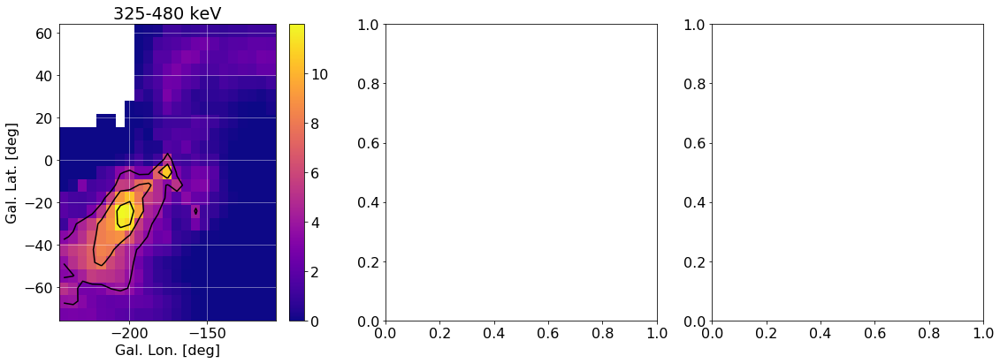

In [351]:
result6.plot_TS_map_results(ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1])

In [352]:
from astropy.stats import bayesian_blocks

In [355]:
len(np.sum(analysis2.dataset.binned_data,axis=(1,2,3)))

308

In [356]:
edges = bayesian_blocks(np.arange(308),x=np.sum(analysis2.dataset.binned_data,axis=(1,2,3)),p0=1-0.683)

In [357]:
edges

array([  0. ,   0.5,   1.5,   5.5,   6.5,   7.5,  11.5,  12.5,  13.5,
        14.5,  22.5,  23.5,  24.5,  34.5,  35.5,  36.5,  39.5,  48.5,
        49.5,  50.5,  63.5,  64.5,  65.5,  70.5,  78.5,  79.5,  80.5,
        92.5,  93.5,  94.5,  95.5, 106.5, 107.5, 108.5, 120.5, 121.5,
       122.5, 134.5, 135.5, 136.5, 148.5, 149.5, 150.5, 162.5, 164.5,
       175.5, 176.5, 177.5, 186.5, 187.5, 188.5, 198.5, 200.5, 209.5,
       210.5, 211.5, 220.5, 222.5, 230.5, 232.5, 242.5, 243.5, 244.5,
       255.5, 256.5, 257.5, 269.5, 270.5, 281.5, 282.5, 293.5, 294.5,
       295.5, 307. ])

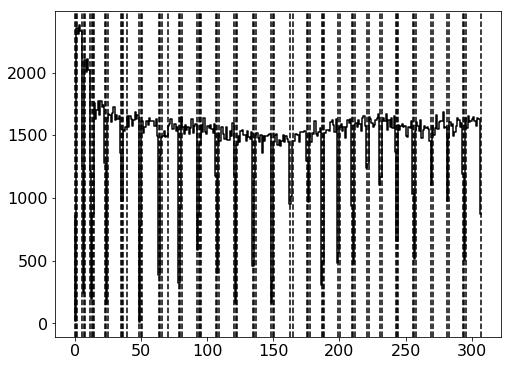

In [358]:
plt.step(np.arange(308),np.sum(analysis2.dataset.binned_data,axis=(1,2,3)))
for e in edges:
    plt.axvline(e,linestyle='--')

In [361]:
all_edges = []
for e in edges:
    all_edges.append(np.where(np.floor(e) == np.arange(308))[0])

all_edges = np.array(all_edges)
all_edges = np.unique(all_edges)
all_edges = all_edges[0:-2]

In [362]:
all_edges

array([  0,   1,   5,   6,   7,  11,  12,  13,  14,  22,  23,  24,  34,
        35,  36,  39,  48,  49,  50,  63,  64,  65,  70,  78,  79,  80,
        92,  93,  94,  95, 106, 107, 108, 120, 121, 122, 134, 135, 136,
       148, 149, 150, 162, 164, 175, 176, 177, 186, 187, 188, 198, 200,
       209, 210, 211, 220, 222, 230, 232, 242, 243, 244, 255, 256, 257,
       269, 270, 281, 282, 293, 294])

In [363]:
background1.make_bg_cuts(list(all_edges+1))

In [364]:
background1.Ncuts

30

In [365]:
background2.make_bg_cuts(list(all_edges+1))

In [366]:
rsp.calculate_PS_response(analysis2.dataset,
                          pointing2,l1,b1,1,
                          background=background2,
                          pixel_size=pixel_size,
                          lookup=False)

In [367]:
result7 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2)

In [368]:
result7.TS_map([L_GRID,B_GRID],scipy=False,ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],lookup=False)

1
Fitting background only...


Initial log joint probability = -227903
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      19       -227869    0.00925979       6.99983           1           1       22   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39       -227869    0.00843153       2.18197           1           1       43   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       -227869   0.000923162       1.05984      0.5949      0.5949       52   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -228256
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      19       -227866     0.0276747       4.44684           1           1       23   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      

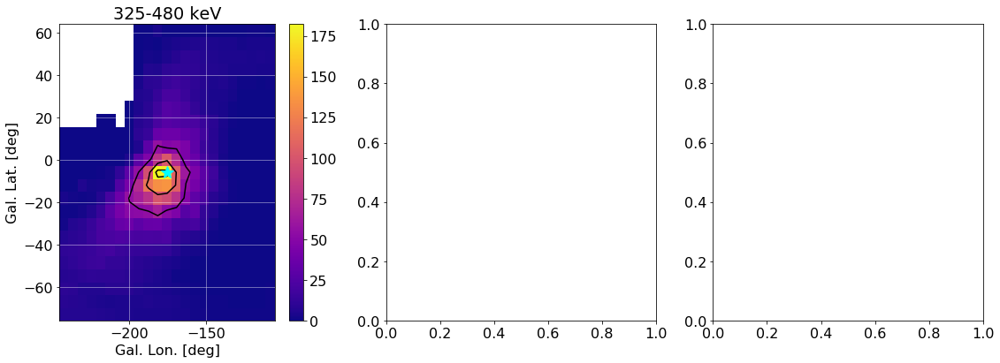

In [370]:
pc = result7.plot_TS_map_results(ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],l_src=l1-360,b_src=b1)

In [371]:
result8 = fit(analysis2.dataset,
              pointing2,
              rsp,
              background2)

In [376]:
lm = np.nanmean(pointing2.zpoins[:,0]+360)-360

In [382]:
l1,b1

(184.55746, -5.78436)

In [377]:
bm = np.nanmean(pointing2.zpoins[:,1])

In [383]:
l_gridg = np.linspace(60,250,20)
b_gridg = np.linspace(-90,90,10)

l_grid = l_gridg[0:-1]+np.diff(l_gridg[0:-1])[0]/2
b_grid = b_gridg[0:-1]+np.diff(b_gridg[0:-1])[0]/2

l_grid[l_grid<-180] += 360

L_GRIDg, B_GRIDg = np.meshgrid(l_gridg,b_gridg)
L_GRID, B_GRID = np.meshgrid(l_grid,b_grid)

In [384]:
result8.TS_map([L_GRID,B_GRID],scipy=False,ebins=[0,1,2,3,4,5,6,7,-1,-1],lookup=False)

8
Fitting background only...


Initial log joint probability = -34610.9
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      19      -34579.6     0.0416357        1.8592           1           1       21   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39      -34579.3     0.0233875       1.10905           1           1       42   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53      -34579.3    0.00226614      0.144239           1           1       57   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -128104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      19       -128063     0.0227874       5.82795           1           1       20   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     

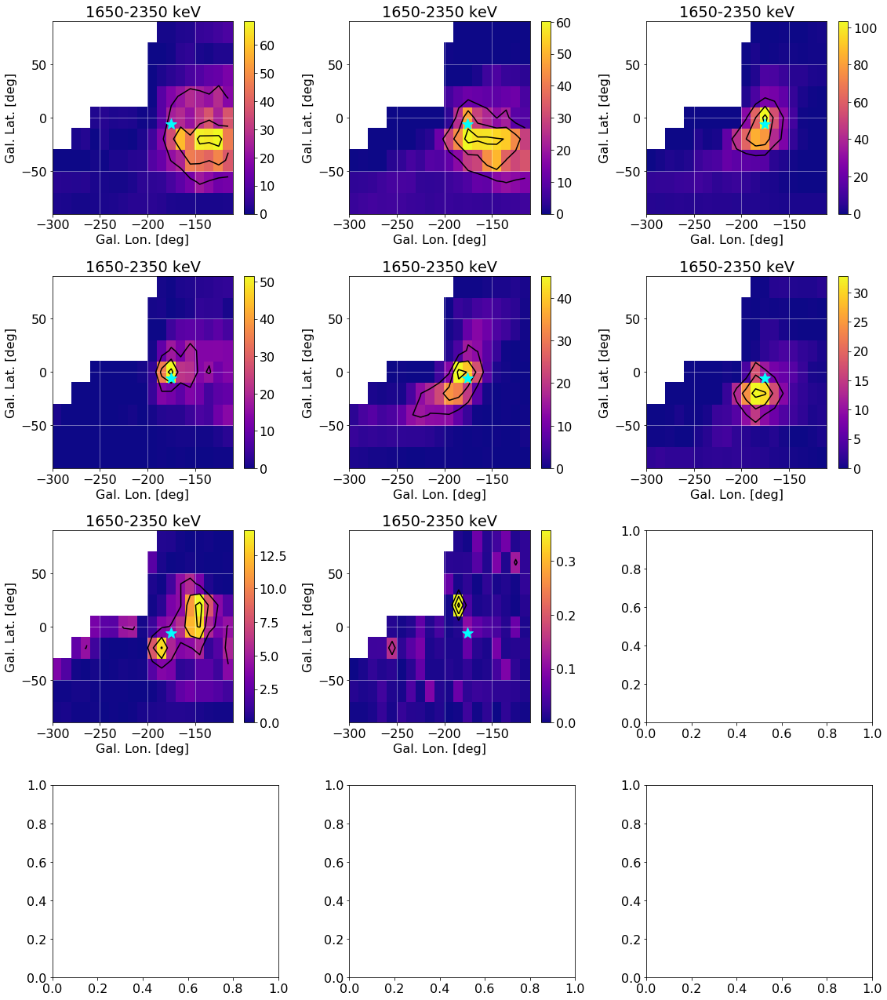

In [385]:
pc = result8.plot_TS_map_results(ebins=[0,1,2,3,4,5,6,7,-1,-1],l_src=l1-360,b_src=b1)

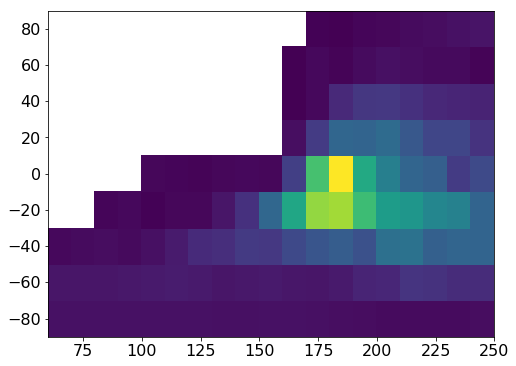

In [387]:
plt.pcolormesh(L_GRIDg,B_GRIDg,np.sum(result8.TS_vals.reshape(8,9,19),axis=0))

In [106]:
n_ph = np.array([len(analysis1.dataset.data_time_tagged[i]['Indices']) for i in range(analysis1.dataset.n_time_bins)])

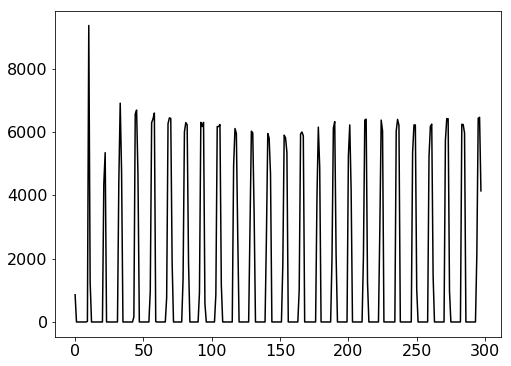

In [108]:
plt.plot(n_ph)

In [93]:
analysis1.simulate_dataset(rsp,
                           pointing1,
                           background1,
                           source_type='point source',
                           source_position=[l1,b1],
                           source_spectrum='powerlaw',
                           source_parameters=[3.9e-6,-2.23],
                           background_scaling=0.0,
                           pixel_size=6,
                           lookup=False)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...
Your computer will explode.
Calculating averaged RMF for object at (l,b) = (184.6,-5.8)


In [94]:
analysis1.sim_dataset.binned_data.shape

(298, 10, 30, 1145)

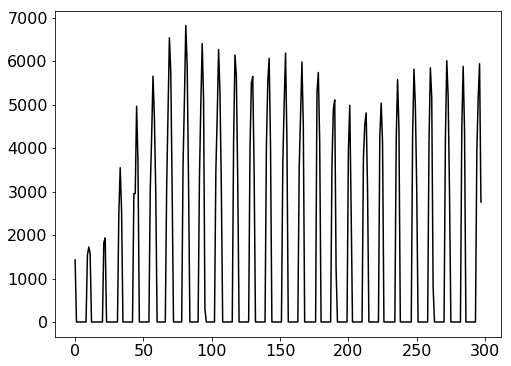

In [95]:
plt.plot(np.sum(analysis1.sim_dataset.binned_data[:,0,:,:],axis=(1,2)))

In [57]:
tracer_sim = np.sum(analysis1.sim_dataset.binned_data,axis=(1,2,3))

In [59]:
tracer_sim = tracer_sim/np.mean(tracer_sim)

In [60]:
# background with tracer (making the zeros zero)
background_sim = BG(dataset=analysis1.sim_dataset,mode='sim 6deg despina',tracer=tracer_sim)

Reading in simulated Ling-model (1973) background response for 6 deg CDS binning from despina only...


In [61]:
rsp.calculate_PS_response(analysis1.sim_dataset,
                          pointing1,l1,b1,1,
                          background=background_sim,
                          pixel_size=pixel_size,
                          lookup=False)

Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (184.6,-5.8)


In [62]:
result_sim1 = fit(analysis1.sim_dataset,
                  pointing1,
                  rsp,
                  background_sim,
                  verbose=True)

In [64]:
result_sim1.MAP_solution(scipy=True)

Start optimising energy bin 1/10...

Energy range: 150-220 keV ...
Start optimising energy bin 2/10...

Energy range: 220-325 keV ...
Start optimising energy bin 3/10...

Energy range: 325-480 keV ...
Start optimising energy bin 4/10...

Energy range: 480-520 keV ...
Start optimising energy bin 5/10...

Energy range: 520-765 keV ...
Start optimising energy bin 6/10...

Energy range: 765-1120 keV ...
Start optimising energy bin 7/10...

Energy range: 1120-1650 keV ...
Start optimising energy bin 8/10...

Energy range: 1650-2350 keV ...
Start optimising energy bin 9/10...

Energy range: 2350-3450 keV ...
Start optimising energy bin 10/10...

Energy range: 3450-5000 keV ...


(1e-08, 0.00019961928755148268)

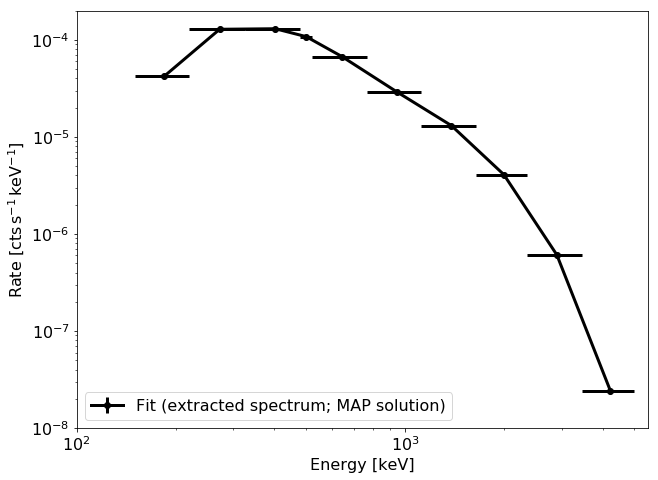

In [65]:
result_sim1.plot_MAP_spectrum()
#step_plot(rsp.e_edges,sim_sky_rate1,color='red',plot_label='Sim') 
plt.legend()
plt.ylim(1e-8)

In [66]:
analysis1.sim_dataset.n_time_bins

298

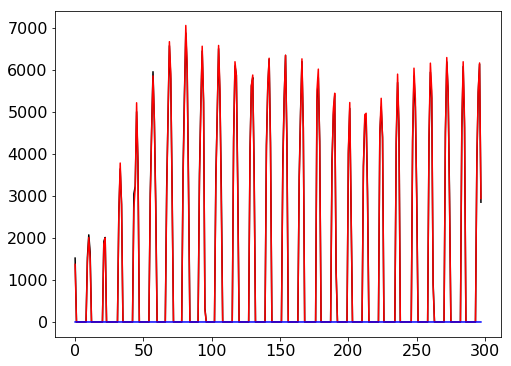

In [81]:
plt.plot(np.sum(analysis1.sim_dataset.binned_data[:,0,:,:],axis=(1,2)))
plt.plot(np.sum(background_sim.bg_model_reduced[0],axis=1))
plt.plot(np.sum(rsp.sky_response[0],axis=1))

In [ ]:
analysis1.sim_d

In [67]:
result_sim1.fit(use_emcee=True)

  0%|          | 4/1000 [00:00<00:29, 33.90it/s]

###################################################################

Start fitting energy bin 1/10...

Energy range: 150-220 keV ...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing took 30.8 seconds


Results:

 Parameter      mean       std      0.15     15.85     50.00     84.15     99.85
        0:  2.11e+04  2.01e+00  2.11e+04  2.11e+04  2.11e+04  2.11e+04  2.11e+04
        1:  9.90e-01  8.51e-05  9.90e-01  9.90e-01  9.90e-01  9.90e-01  9.90e-01
###################################################################
###################################################################

Start fitting energy bin 2/10...

Energy range: 220-325 keV ...


 76%|███████▌  | 761/1000 [00:48<00:15, 15.03it/s]

emcee: Exception while calling your likelihood function:
  params: [9.61770779e+04 9.90001216e-01]
  args: (array([0, 0, 0, ..., 2, 1, 2]), array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
       9.54441660e-07, 7.85527443e-07, 3.58776035e-07]), array([0.01349684, 0.02699369, 0.00674842, ..., 2.71637185, 1.71940559,
       0.86692719]))
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/usr/local/Cellar/python/3.7.7/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/emcee/ensemble.py", line 495, in __call__
    return self.f(x, *self.args, **self.kwargs)
  File "/Users/thomassiegert/python/COSIpy/COSIpy/fit.py", line 1232, in COSImodfit
    stat = -2*np.sum(total_model - data*(np.log(total_model)))
KeyboardInterrupt



KeyboardInterrupt: 

In [315]:
result_sim1.TS_map([L_GRID,B_GRID],scipy=False,ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1],lookup=False)

1
Fitting background only...


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...


Now fitting object at (l,b) = (-189.9,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-189.9,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-186.1,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-186.1,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-182.3,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-182.3,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-62.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-62.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-58.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-58.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-54.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-54.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-50.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-50.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-46.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-46.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-42.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-42.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-39.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-39.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-35.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-35.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-31.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-31.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-27.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-27.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-23.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-23.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-20.1)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-20.1)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-16.3)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-16.3)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-12.5)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-12.5)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-8.7)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-8.7)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-4.9)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-4.9)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,-1.0)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,-1.0)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,2.8)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,2.8)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,6.6)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,6.6)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,10.4)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,10.4)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (170.1,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (170.1,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (173.9,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (173.9,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (177.7,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (177.7,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-178.5,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-178.5,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-174.7,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-174.7,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-170.8,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-170.8,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-167.0,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-167.0,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-163.2,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-163.2,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-159.4,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-159.4,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-155.6,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-155.6,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-151.8,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-151.8,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-148.0,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-148.0,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-144.2,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-144.2,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-140.4,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-140.4,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-136.6,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-136.6,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-132.8,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-132.8,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-128.9,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-128.9,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-125.1,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-125.1,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-121.3,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-121.3,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-117.5,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-117.5,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Now fitting object at (l,b) = (-113.7,14.2)
Calculating zeniths and azimuths for all pointings ...
Done.

Calculating CDS count expectations for all bins ...


Done.

Calculating averaged RMF for object at (l,b) = (-113.7,14.2)


Skipping energy range: 150-220 keV ...
Skipping energy range: 220-325 keV ...
Skipping energy range: 480-520 keV ...
Skipping energy range: 520-765 keV ...
Skipping energy range: 765-1120 keV ...
Skipping energy range: 1120-1650 keV ...
Skipping energy range: 1650-2350 keV ...
Skipping energy range: 2350-3450 keV ...
Skipping energy range: 3450-5000 keV ...
Initial log joint probability = -72063.9
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
       9      -66583.5   0.000492938      0.238709      0.5739      0.5739       10   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -70928.3
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      19      -66577.5     0.0191605       3.03806       0.739       0.739       20   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
  

array([<matplotlib.axes._subplots.AxesSubplot object at 0x16916b350>,
      dtype=object)

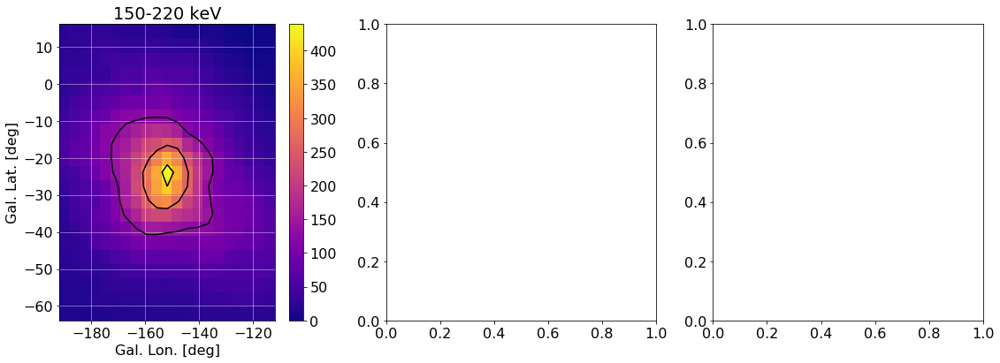

In [316]:
result_sim1.plot_TS_map_results(ebins=[-1,-1,2,-1,-1,-1,-1,-1,-1,-1])

In [69]:
%load_ext autoreload

In [70]:
%aimport COSIpy, fit, response

In [71]:
%autoreload 1

IndexError: list index out of range

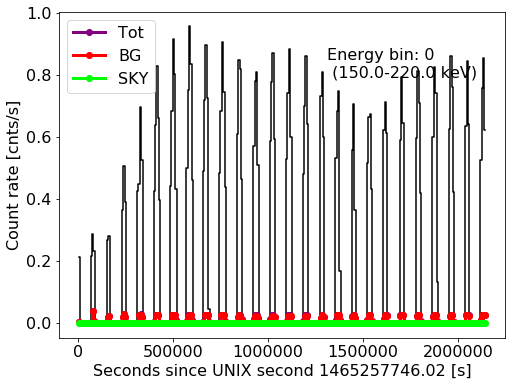

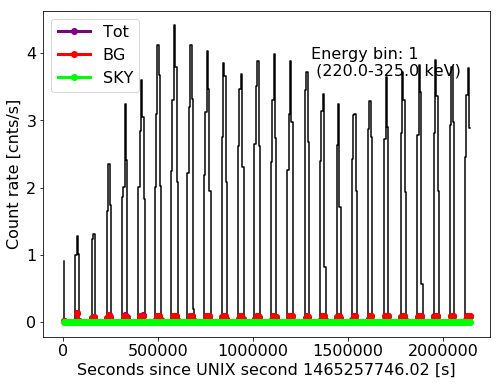

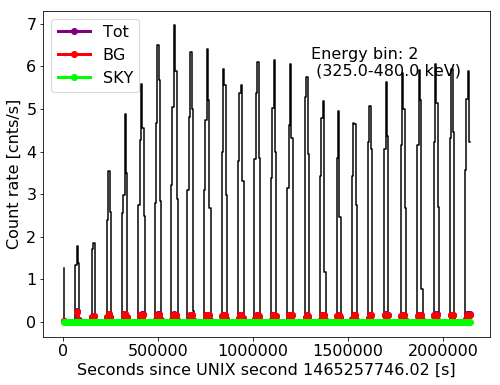

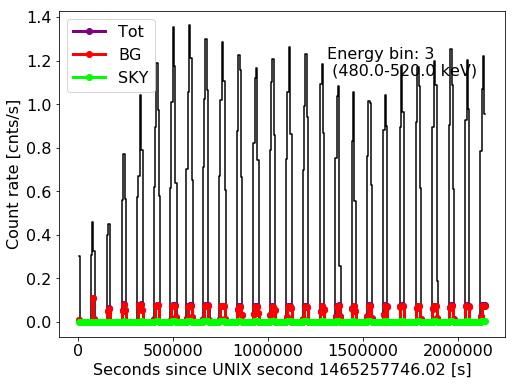

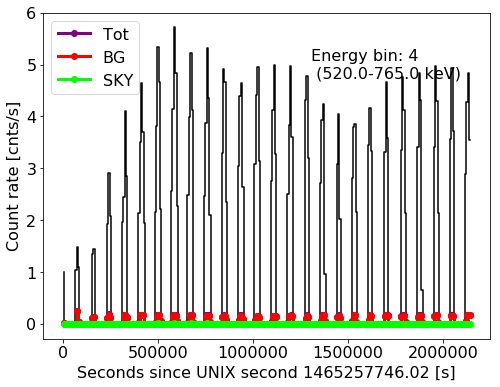

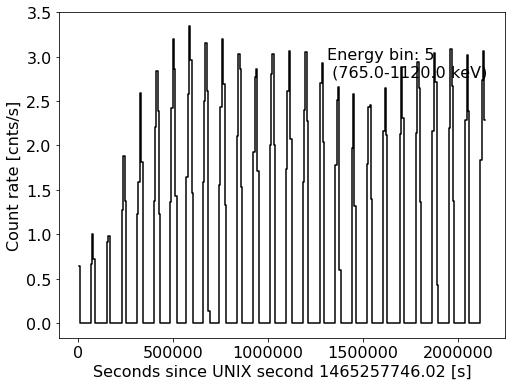

In [73]:
b = 5

for b in range(10):
    analysis1.dataset.plot_lightcurve(b)

    #plt.twinx()

    plt.step(analysis1.dataset.times.times_cen,
             (np.sum(background1.bg_model_reduced[b],axis=1)*result1.fit_pars[b][1,0] + \
             np.sum(rsp.sky_response[b],axis=1)*result1.fit_pars[b][0,0])/(analysis1.dataset.times.times_wid*2),
             color='purple',where='mid',marker='o',linewidth=3,label='Tot')

    plt.step(analysis1.dataset.times.times_cen,
             np.sum(background1.bg_model_reduced[b],axis=1)*result1.fit_pars[b][1,0]/(analysis1.dataset.times.times_wid*2),
             color='red',where='mid',marker='o',linewidth=3,label='BG')

    plt.step(analysis1.dataset.times.times_cen,
             np.sum(rsp.sky_response[b],axis=1)*result1.fit_pars[b][0,0]/(analysis1.dataset.times.times_wid*2),
             color='lime',where='mid',marker='o',linewidth=3,label='SKY')

    plt.legend(loc=2)

    #plt.plot(analysis.dataset.times.times_max[0::2],
    #         np.median(result.fit_pars[b]['Abg'],axis=0),color='red')
    #plt.plot(analysis.dataset.times.times_cen,
    #         np.sum(rsp.sky_response[b],axis=1),color='lime')

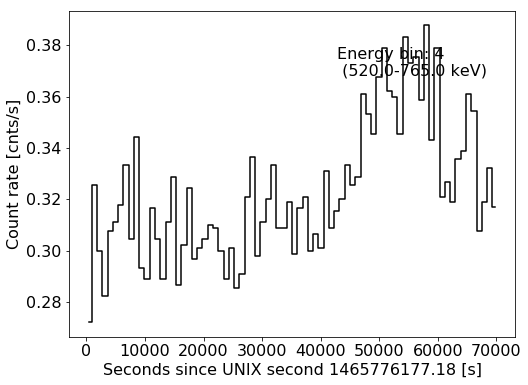

In [239]:
analysis2.dataset.plot_lightcurve(4)